<a href="https://colab.research.google.com/github/BassoTara/ImageRetrieval/blob/master/retrieval_students_cnn_giuliobassetti.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Retrieval using Bag of Visual Words

In this tutorial you will compare bag of words handcrafted features with a pre-trained neural network  as a feature extractor for image retrieval. In this first part we will employ feature quantization as a mean to speed up image retrieval on images with ~10,000 local image features  each.
##What is Image Retrieval?

Image retrieval is the task of, given a *query* image, re-ordering a set of images so that images which are most similar to the query have higher rank than less similar ones. A practical example would be, given a picture of the Tour Eiffel, and a folder containing thousands of images, find the three that depict the famous Paris monument.

Here is an example result of the system you are going to build today. The first picture is the query. Query is contained in the dataset therefore the first result is correctly the image itself. Following images are, ordered left-to-right by decreasing similarity.
![Retrieval Example](http://leon.micc.unifi.it/retrieval/boats.png)
![Retrieval Example](http://leon.micc.unifi.it/retrieval/tree.png)
![Retrieval Example](http://leon.micc.unifi.it/retrieval/rocks.png)



##Dataset
We are going to use the Holidays dataset created by INRIA. Holidays dataset is an annotated set of 1491 images with 500 query images.
http://lear.inrialpes.fr/~jegou/data.php

##Example images from Holidays
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/101800_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/101800_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/105000_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/105000_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/108103_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/108103_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/111601_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/111601_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/114701_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/114701_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/117102_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/117102_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/121001_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/121001_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/125701_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/125701_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/127000_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/127000_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/131401_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/131401_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/112003_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/112003_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/115201_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/115201_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/118501_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/118501_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/123205_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/123205_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/125900_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/125900_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/129202_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/129202_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/131802_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/131802_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/102501_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/102501_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/107300_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/107300_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/110701_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/110701_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/112301_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/112301_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/115501_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/115501_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/120300_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/120300_sm.jpg" width=150></a>
<a href="http://lear.inrialpes.fr/~jegou/data/holidays/125501_sm.jpg"><img src="http://lear.inrialpes.fr/~jegou/data/holidays/125501_sm.jpg" width=150></a>




In [0]:
#install cupy in case you have a GPU runtime this can speed up numpy computation
from IPython.utils import io
with io.capture_output():
  !apt -y -q install cuda-libraries-dev-9-2
  !pip install -q cupy-cuda92 chainer
import cupy as cp


In [0]:
#import dependencies
import glob
import numpy as np
import ntpath
from IPython.utils import io
import matplotlib.pyplot as plt
from google.colab import drive
#drive.mount('/content/gdrive') #mount your google drive to export images, features, data, etc...

In [0]:
#function to show neat progress bars
from IPython.display import HTML, display
import time

def progress(value, max=100):
    return HTML("""
        <progress
            value='{value}'
            max='{max}',
            style='width: 100%'
        >
            {value}
        </progress>
    """.format(value=value, max=max))



## Download the images

In [135]:
#get a dataset of resized images to display results
!wget http://leon.micc.unifi.it/holidays_small.tar.gz
with io.capture_output() as extracted_files: #this will avoid cluttering with the output. Remove this line to see command line output
  !tar xzvf holidays_small.tar.gz 

--2018-10-31 14:28:45--  http://leon.micc.unifi.it/holidays_small.tar.gz
Resolving leon.micc.unifi.it (leon.micc.unifi.it)... 150.217.35.168
Connecting to leon.micc.unifi.it (leon.micc.unifi.it)|150.217.35.168|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 207187552 (198M) [application/x-gzip]
Saving to: ‘holidays_small.tar.gz.3’

holidays_small.tar. 100%[===================>] 197.59M  4.00MB/s    in 62s     

2018-10-31 14:29:47 (3.19 MB/s) - ‘holidays_small.tar.gz.3’ saved [207187552/207187552]



In [136]:
# get all filenames and extract query ids
import ntpath
imnames = [ntpath.basename(x).split('.')[0] for x in glob.glob('holidays_small/*.jpg')]

# get the indices of the query images (the subset of images that end in "00")
query_imids = [i for i, name in enumerate(imnames) if name[-2:].split('.')[0] == "00"]

# check that everything is fine - expected output: "tot images = 1491, query images = 500"
print('tot images = %d, query images = %d' % (len(imnames), len(query_imids)))

tot images = 1491, query images = 500


## Download a pretrained CNN

We are going to use [Keras](https://keras.io/), a high level API for deep learning libraries such as tensorflow and theano. The default backend should be tensorflow, feel free to integrate some tensorflow code if you are familiar with it (though it will not be needed for this lab session). 

In [137]:
!pip install keras
import keras
keras.__version__

'2.1.6'

Keras provides some pretrained models already trained on large scale datasets. We are not going to train these models today since it takes hours or even days, depending on the model.
Among the available models you can find VGG, Inception, ResNet, etc... If you import them, Keras will automatically download the weights of the model and you are ready to use it.

In [0]:
from keras.applications import VGG16
from keras import backend as K

In [139]:
model = VGG16(weights='imagenet', include_top=True)

# With model.summary() you can check all the layers in the model
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

# Feature extraction
Deep Neural Networks such as CNNs are composed by a sequence of layers. Each layer takes as input the output of the previous layer, processes it and outputs a feature map. The first layers produce feature maps that focus on low level image traits such as edges, while the layers closer to the end extract more semantic information such as parts of objects, faces, ecc.

An image intermediate feature extracted by a CNN can be used as a compact and highly informative global representation of the image itself.

We are going to create a new model and use it as a feature extractor and we are then going to compare these features for our image retrieval task. This model is exactly the same as the original model but is truncated up to the layer we want to extract the features from.

Le'ts try with the last *Dense* layer: *fc2*.

In [0]:
from keras.models import Model

# Check the input size required by the model
input_shape = model.input_shape[1:3]

# Choose a layer
layer_name = 'fc2'
layer_output = model.get_layer(layer_name).output

# Creates a model that will return these outputs, given the model input:
extraction_model = Model(inputs=model.input, outputs=layer_output)

In [0]:
import PIL

# A function to help us extract features given the image path
def extract_feature(model, img_id):
  img_path = 'holidays_small/'+ img_id +'.jpg'
  img = PIL.Image.open(img_path).resize((input_shape),PIL.Image.BILINEAR)
  return model.predict(np.expand_dims(img, axis=0))


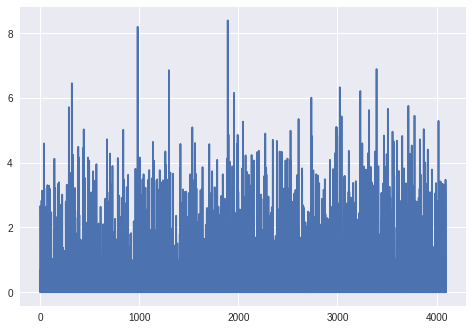

In [142]:
# Let's test the feature extractor model on a sample image
feat = extract_feature(extraction_model, imnames[0])
plt.plot(feat[0,:])
plt.show()

## Extract features for all the images
**Exercise**: Using the provided functions, extract features from all the images in the dataset and for all the queries and compute the similarities like you did with the SIFT descriptors. Compute the mAP, do you get any improvement?

In [0]:
# extract all features

num_imgs = len(imnames)

# Get the size of the feature we are using
feat_size = output_shape = extraction_model.output_shape[-1]

# Preallocate the matrix for storing all the features
all_feats = np.zeros((len(imnames), feat_size))

# Extract features
for index, imname in enumerate(imnames):
  all_feats[index] = extract_feature(extraction_model, imname)

In [144]:
print(all_feats.shape)
print(all_feats)

(1491, 4096)
[[0.6733743  0.         0.16263026 ... 0.         0.         0.        ]
 [4.13992834 0.         1.2700206  ... 0.55423707 0.4360885  0.        ]
 [3.06232071 0.         0.03876108 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         2.9932394  ... 1.02149749 0.         0.        ]
 [0.         0.         3.00017834 ... 0.         0.         0.        ]]


In [145]:
print(query_imids)

[4, 7, 9, 11, 14, 20, 21, 22, 23, 29, 35, 37, 38, 40, 41, 42, 46, 47, 48, 49, 52, 57, 66, 70, 76, 78, 80, 86, 87, 89, 91, 92, 94, 96, 98, 100, 101, 105, 106, 107, 108, 110, 112, 116, 117, 120, 125, 126, 127, 133, 135, 139, 140, 147, 148, 149, 157, 159, 162, 164, 168, 172, 176, 190, 192, 200, 214, 215, 216, 220, 225, 227, 232, 233, 238, 244, 247, 249, 252, 256, 262, 263, 267, 269, 270, 272, 275, 276, 282, 285, 287, 288, 289, 293, 295, 297, 299, 300, 304, 306, 307, 308, 309, 310, 312, 314, 318, 322, 324, 328, 332, 336, 337, 343, 348, 350, 351, 354, 357, 359, 362, 365, 367, 376, 379, 388, 390, 391, 394, 401, 402, 409, 413, 414, 415, 417, 424, 426, 428, 429, 433, 435, 436, 437, 440, 445, 446, 455, 456, 460, 463, 466, 467, 473, 474, 480, 481, 482, 485, 487, 488, 489, 490, 492, 494, 497, 501, 503, 509, 512, 513, 514, 520, 524, 526, 534, 538, 539, 540, 542, 545, 546, 550, 551, 553, 557, 561, 566, 568, 569, 571, 573, 576, 583, 590, 593, 599, 602, 612, 615, 618, 619, 620, 625, 626, 630, 634, 63

In [0]:
# extract query features

num_queries = len(query_imids)

# Preallocate the matrix for storing all the features for the queries
query_feats = np.zeros((num_queries, feat_size))

# Extract features
query_feats = all_feats[query_imids]

In [147]:
print(query_feats.shape)
print(query_feats)

(500, 4096)
[[0.75776517 0.         0.         ... 0.         2.32361603 0.        ]
 [0.39234912 0.         0.85327923 ... 0.         0.78522021 1.82882142]
 [2.2298851  0.         1.93244374 ... 0.         0.         1.04788756]
 ...
 [2.88422108 0.78092802 0.         ... 0.         2.33903527 0.        ]
 [0.14016581 0.         1.49908781 ... 0.         0.         1.17819858]
 [0.         0.         0.         ... 0.         0.         0.        ]]


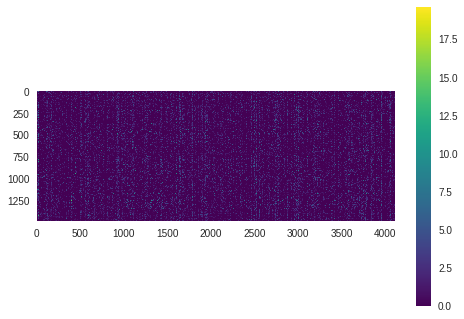

In [148]:
# Show the feature matrix of the extracted images

plt.imshow(all_feats, cmap='viridis')
plt.colorbar()
plt.grid(False)
plt.show()

In [149]:
# sanity check on the exctracted features
(all_feats.shape, query_feats.shape)

((1491, 4096), (500, 4096))

## Compute similarities between queries and images

compute all distances between queries and data
create a matrix containing for each row indices, sorted by decreasing similarity with the query
store distances in a variable:

distances
and image ids, ranked in the variable:

indices
indices is an integer array that should have shape: (500,1491)

In [150]:
from sklearn.neighbors import NearestNeighbors#

#SOLUTION
nbrs = NearestNeighbors(n_neighbors=len(imnames), metric='cosine').fit(all_feats)
distances, indices = nbrs.kneighbors(query_feats)

print(distances.shape)
print(indices.shape)
print(indices)

(500, 1491)
(500, 1491)
[[   4 1126 1196 ...  596  594  464]
 [   7  476 1170 ...  775 1079  230]
 [   9 1073 1208 ...  345  473  382]
 ...
 [1484  387 1214 ...  375  671   25]
 [1487  404 1180 ...  209 1153   25]
 [1488  281  274 ...  464 1153 1323]]


#How did we do?
In retrieval we use mean Average Precision (mAP for short). It is the average precision value computed over a range of recall values. This can be also seen as the area below the Precision-Recal Plot

![Average Precision](http://scikit-learn.org/stable/_images/sphx_glr_plot_precision_recall_001.png)

Average precision evaluate how good a ranking is. This means that a high mAP corresponds to a ranking with the few relevant images in the first positions.

##Questions

1.   What happens when you extract features from another layer? For now just focus on Dense layers.
2.   What metrics can you employ for computing the distances? Try a few of them

In [0]:
#this function create a perfect ranking :)
def make_perfect_holidays_result(imnames, q_ids):
  perfect_idx =[]
  for qimno in q_ids:
      qname = imnames[qimno]
      positive_results = set([i for i, name in enumerate(imnames) if name != qname and name[:4] == qname[:4]])
      ok=[qimno]+[i for i in  positive_results]
      others = [i for i in range(1491) if i not in positive_results and i != qimno]
      perfect_idx.append(ok+others)
  return np.array(perfect_idx)


In [152]:
def mAP(q_ids, idx):
  aps = []
  for qimno, qres in zip(q_ids, idx):
      qname = imnames[qimno]
      # collect the positive results in the dataset
      # the positives have the same prefix as the query image
      positive_results = set([i for i, name in enumerate(imnames)
                              if name != qname and name[:4] == qname[:4]])
      #
      # ranks of positives. We skip the result #0, assumed to be the query image
      ranks = [i for i, res in enumerate(qres[1:]) if res in positive_results]
      #
      # accumulate trapezoids with this basis
      recall_step = 1.0 / len(positive_results)
      ap = 0
      for ntp,rank in enumerate(ranks):
          # ntp = nb of true positives so far
          # rank = nb of retrieved items so far
          # y-size on left side of trapezoid:
          precision_0 = ntp/float(rank) if rank > 0 else 1.0
          # y-size on right side of trapezoid:
          precision_1 = (ntp + 1) / float(rank + 1)
          ap += (precision_1 + precision_0) * recall_step / 2.0
      #print('query %s, AP = %.3f' % (qname, ap))
      aps.append(ap)
  return np.mean(aps)
print('mean AP = %.3f'%mAP(query_imids, indices))
perfect_result=make_perfect_holidays_result(imnames, query_imids)
print('Perfect mean AP = %.3f'%mAP(query_imids,perfect_result))

mean AP = 0.668
Perfect mean AP = 1.000


##Qualitative Result Inspection
It is often interesting to observe the behavior of our algorithms qualitatively. We can often learn a lot about the features we are using and how their invariance and robustness to transformations can help retrieval.

##Exercise
Check the results. Which differences do you notice between the retrieved results using SIFT and a CNN?

In [0]:
import PIL

import math
def montage(imfiles, thumb_size=(100,100), ok=None, shape=None ):
  #this function will create an image with thumbnailed version of imfiles.
  #optionally the user can provide an ok list such that len(ok)==len(imfiles) to differentiate correct from wrong results
  #optionally the user can provide a shape function which shapes the montage otherwise a square image is created.  
  images = [PIL.Image.open(imname).resize(thumb_size,PIL.Image.BILINEAR) for imname in imfiles]
  #create a big image to contain all images
  if shape is None:
    n = int(math.sqrt(len(imfiles)))
    m=n
  else:
    n=shape[0]
    m=shape[1]
  new_im = PIL.Image.new('RGB', (m*thumb_size[0],n*thumb_size[0]))
  k=0
  for i in range(0,n*thumb_size[0], thumb_size[0]):
    for j in range(0,m*thumb_size[0], thumb_size[0]):
      region=(j,i)
      if ok is not None:
        if ok[k]:
          color = (0,255,0)
        else:
          color  = (255,0,0)
        if k > 0:
          imar = np.array(images[k],dtype=np.uint8)
          imar[0:5,:,:] = color;
          imar[:,0:5,:] = color;
          imar[-5:,:,:] = color;
          imar[:,-5:,:] = color;
          images[k]=PIL.Image.fromarray(imar)
      new_im.paste(images[k] ,box=region)
      k+=1
  return new_im

In [0]:
#here we show the first 25 queries and their 15 closest neighbours retrieved
#gree border means ok, red wrong :)
def show_result(display_idx, nqueries=10, nresults=10,ts=(100,100)):

  from IPython.display import display
  if nqueries is not None :
    nrow = nqueries   # number of query images to show
  
  if nresults is not None :
    nres = 10  # number of results per query

  for qno in range(nrow):
      imfiles=[]
      oks = [True]
      # show query image with white outline
      qimno = query_imids[qno]
      imfiles.append('holidays_small/'+imnames[qimno]+'.jpg')
      for qres in display_idx[qno, :nres]:
          # use image name to determine if it is a TP or FP result
          oks.append(imnames[qres][:4] == imnames[qimno][:4])
          imfiles.append('holidays_small/'+imnames[qres]+'.jpg')
      print (qno, (imfiles))
      display(montage(imfiles,thumb_size=ts,ok=oks, shape=(1,nres)))



0 ['holidays_small/129000.jpg', 'holidays_small/129000.jpg', 'holidays_small/129002.jpg', 'holidays_small/129003.jpg', 'holidays_small/131000.jpg', 'holidays_small/105102.jpg', 'holidays_small/107300.jpg', 'holidays_small/104402.jpg', 'holidays_small/131001.jpg', 'holidays_small/127100.jpg', 'holidays_small/105100.jpg']


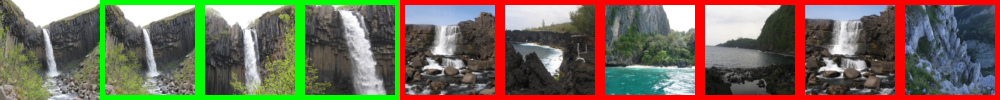

1 ['holidays_small/142000.jpg', 'holidays_small/142000.jpg', 'holidays_small/142001.jpg', 'holidays_small/142003.jpg', 'holidays_small/142002.jpg', 'holidays_small/142004.jpg', 'holidays_small/124501.jpg', 'holidays_small/124500.jpg', 'holidays_small/139404.jpg', 'holidays_small/123100.jpg', 'holidays_small/149001.jpg']


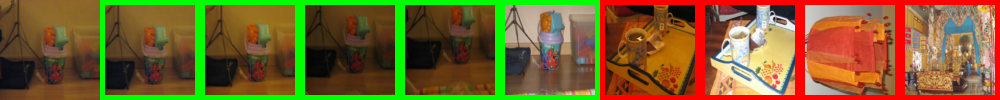

2 ['holidays_small/138500.jpg', 'holidays_small/138500.jpg', 'holidays_small/138506.jpg', 'holidays_small/138502.jpg', 'holidays_small/138507.jpg', 'holidays_small/138503.jpg', 'holidays_small/138307.jpg', 'holidays_small/138501.jpg', 'holidays_small/109101.jpg', 'holidays_small/138504.jpg', 'holidays_small/138505.jpg']


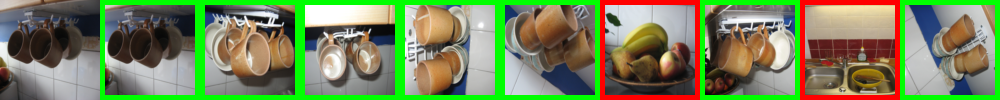

3 ['holidays_small/129900.jpg', 'holidays_small/129900.jpg', 'holidays_small/129901.jpg', 'holidays_small/123601.jpg', 'holidays_small/123602.jpg', 'holidays_small/143702.jpg', 'holidays_small/119300.jpg', 'holidays_small/123600.jpg', 'holidays_small/143501.jpg', 'holidays_small/101300.jpg', 'holidays_small/137601.jpg']


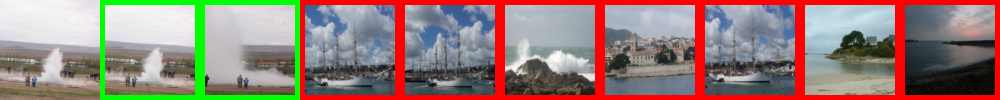

4 ['holidays_small/112700.jpg', 'holidays_small/112700.jpg', 'holidays_small/112800.jpg', 'holidays_small/132300.jpg', 'holidays_small/114401.jpg', 'holidays_small/108301.jpg', 'holidays_small/112801.jpg', 'holidays_small/110702.jpg', 'holidays_small/109901.jpg', 'holidays_small/112701.jpg', 'holidays_small/109900.jpg']


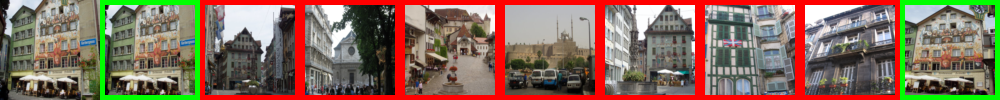

5 ['holidays_small/139100.jpg', 'holidays_small/139100.jpg', 'holidays_small/139101.jpg', 'holidays_small/139104.jpg', 'holidays_small/139103.jpg', 'holidays_small/139105.jpg', 'holidays_small/139102.jpg', 'holidays_small/139400.jpg', 'holidays_small/130300.jpg', 'holidays_small/138505.jpg', 'holidays_small/138010.jpg']


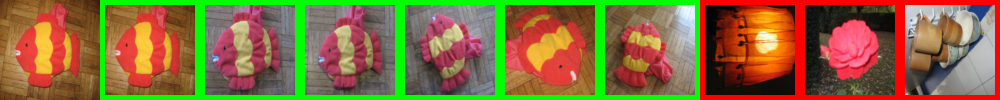

6 ['holidays_small/149600.jpg', 'holidays_small/149600.jpg', 'holidays_small/102900.jpg', 'holidays_small/141300.jpg', 'holidays_small/128700.jpg', 'holidays_small/140802.jpg', 'holidays_small/149603.jpg', 'holidays_small/117000.jpg', 'holidays_small/140801.jpg', 'holidays_small/128701.jpg', 'holidays_small/149601.jpg']


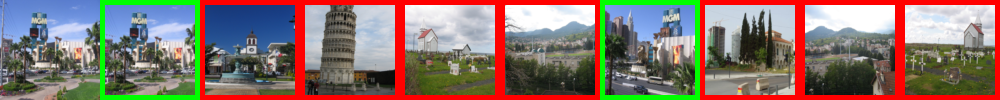

7 ['holidays_small/104500.jpg', 'holidays_small/104500.jpg', 'holidays_small/104502.jpg', 'holidays_small/106101.jpg', 'holidays_small/137000.jpg', 'holidays_small/116700.jpg', 'holidays_small/104501.jpg', 'holidays_small/122302.jpg', 'holidays_small/106600.jpg', 'holidays_small/112500.jpg', 'holidays_small/122301.jpg']


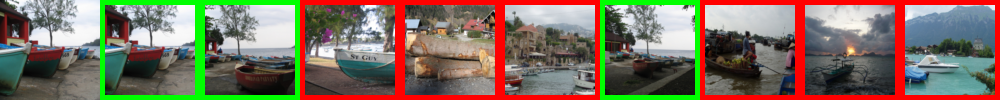

8 ['holidays_small/139700.jpg', 'holidays_small/139700.jpg', 'holidays_small/144301.jpg', 'holidays_small/141500.jpg', 'holidays_small/144200.jpg', 'holidays_small/129400.jpg', 'holidays_small/144601.jpg', 'holidays_small/144201.jpg', 'holidays_small/139701.jpg', 'holidays_small/144300.jpg', 'holidays_small/137704.jpg']


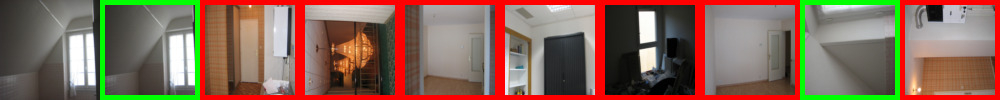

9 ['holidays_small/110300.jpg', 'holidays_small/110300.jpg', 'holidays_small/114301.jpg', 'holidays_small/126901.jpg', 'holidays_small/126900.jpg', 'holidays_small/126500.jpg', 'holidays_small/126502.jpg', 'holidays_small/126400.jpg', 'holidays_small/126501.jpg', 'holidays_small/126402.jpg', 'holidays_small/126401.jpg']


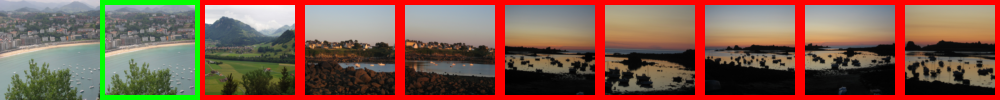

10 ['holidays_small/137500.jpg', 'holidays_small/137500.jpg', 'holidays_small/137501.jpg', 'holidays_small/137502.jpg', 'holidays_small/137503.jpg', 'holidays_small/137504.jpg', 'holidays_small/149500.jpg', 'holidays_small/138503.jpg', 'holidays_small/124400.jpg', 'holidays_small/142002.jpg', 'holidays_small/128601.jpg']


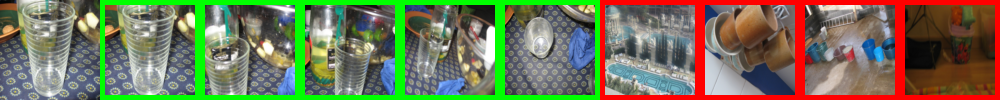

11 ['holidays_small/113700.jpg', 'holidays_small/113700.jpg', 'holidays_small/100401.jpg', 'holidays_small/134502.jpg', 'holidays_small/113701.jpg', 'holidays_small/134802.jpg', 'holidays_small/135000.jpg', 'holidays_small/134701.jpg', 'holidays_small/134804.jpg', 'holidays_small/100400.jpg', 'holidays_small/135001.jpg']


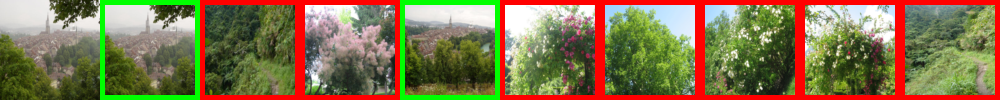

12 ['holidays_small/130100.jpg', 'holidays_small/130100.jpg', 'holidays_small/130101.jpg', 'holidays_small/130102.jpg', 'holidays_small/102802.jpg', 'holidays_small/104802.jpg', 'holidays_small/131102.jpg', 'holidays_small/101502.jpg', 'holidays_small/115300.jpg', 'holidays_small/129600.jpg', 'holidays_small/129601.jpg']


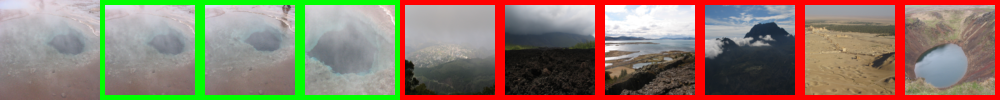

13 ['holidays_small/128100.jpg', 'holidays_small/128100.jpg', 'holidays_small/128101.jpg', 'holidays_small/149101.jpg', 'holidays_small/148002.jpg', 'holidays_small/147702.jpg', 'holidays_small/136902.jpg', 'holidays_small/136900.jpg', 'holidays_small/100200.jpg', 'holidays_small/146502.jpg', 'holidays_small/148202.jpg']


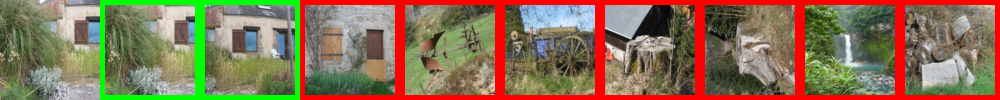

14 ['holidays_small/126300.jpg', 'holidays_small/126300.jpg', 'holidays_small/144103.jpg', 'holidays_small/126301.jpg', 'holidays_small/126902.jpg', 'holidays_small/129901.jpg', 'holidays_small/134200.jpg', 'holidays_small/131900.jpg', 'holidays_small/126600.jpg', 'holidays_small/131301.jpg', 'holidays_small/143904.jpg']


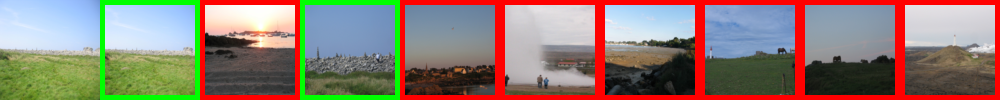

15 ['holidays_small/119100.jpg', 'holidays_small/119100.jpg', 'holidays_small/119203.jpg', 'holidays_small/119202.jpg', 'holidays_small/119600.jpg', 'holidays_small/119101.jpg', 'holidays_small/119900.jpg', 'holidays_small/119605.jpg', 'holidays_small/120702.jpg', 'holidays_small/122002.jpg', 'holidays_small/119201.jpg']


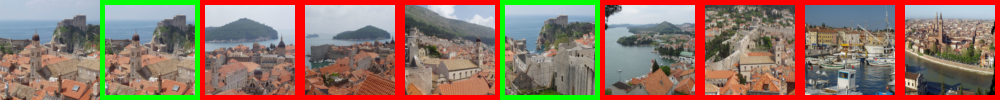

16 ['holidays_small/119400.jpg', 'holidays_small/119400.jpg', 'holidays_small/119401.jpg', 'holidays_small/117200.jpg', 'holidays_small/119000.jpg', 'holidays_small/117201.jpg', 'holidays_small/122504.jpg', 'holidays_small/117403.jpg', 'holidays_small/117400.jpg', 'holidays_small/120702.jpg', 'holidays_small/119801.jpg']


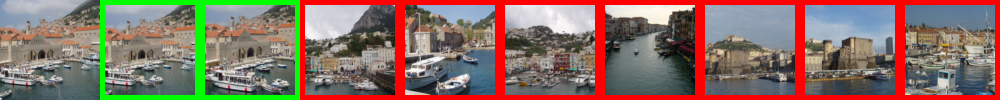

17 ['holidays_small/124800.jpg', 'holidays_small/124800.jpg', 'holidays_small/124801.jpg', 'holidays_small/107702.jpg', 'holidays_small/102802.jpg', 'holidays_small/107700.jpg', 'holidays_small/107701.jpg', 'holidays_small/133600.jpg', 'holidays_small/124802.jpg', 'holidays_small/133601.jpg', 'holidays_small/129101.jpg']


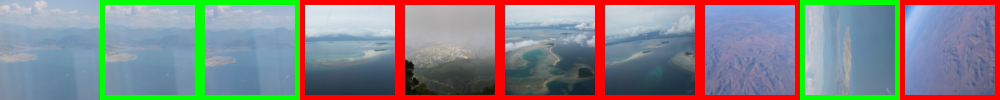

18 ['holidays_small/104900.jpg', 'holidays_small/104900.jpg', 'holidays_small/104901.jpg', 'holidays_small/104902.jpg', 'holidays_small/148300.jpg', 'holidays_small/102800.jpg', 'holidays_small/132508.jpg', 'holidays_small/147000.jpg', 'holidays_small/132511.jpg', 'holidays_small/147300.jpg', 'holidays_small/148400.jpg']


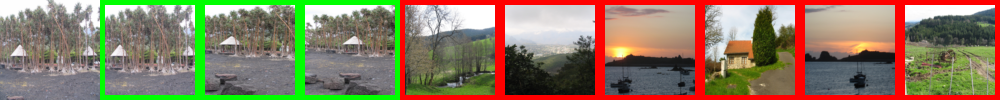

19 ['holidays_small/142500.jpg', 'holidays_small/142500.jpg', 'holidays_small/142502.jpg', 'holidays_small/142601.jpg', 'holidays_small/108900.jpg', 'holidays_small/144402.jpg', 'holidays_small/149001.jpg', 'holidays_small/144401.jpg', 'holidays_small/144501.jpg', 'holidays_small/109201.jpg', 'holidays_small/145101.jpg']


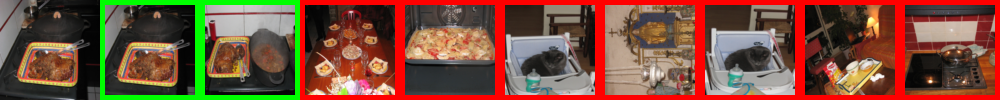

20 ['holidays_small/123400.jpg', 'holidays_small/123400.jpg', 'holidays_small/123401.jpg', 'holidays_small/123404.jpg', 'holidays_small/112000.jpg', 'holidays_small/117201.jpg', 'holidays_small/123403.jpg', 'holidays_small/118900.jpg', 'holidays_small/144103.jpg', 'holidays_small/117403.jpg', 'holidays_small/119800.jpg']


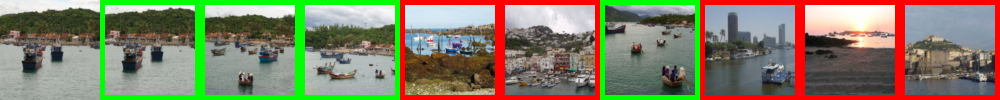

21 ['holidays_small/134100.jpg', 'holidays_small/134100.jpg', 'holidays_small/134101.jpg', 'holidays_small/131805.jpg', 'holidays_small/132801.jpg', 'holidays_small/128600.jpg', 'holidays_small/110401.jpg', 'holidays_small/125701.jpg', 'holidays_small/125702.jpg', 'holidays_small/128601.jpg', 'holidays_small/109802.jpg']


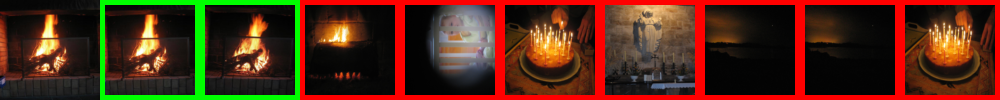

22 ['holidays_small/146900.jpg', 'holidays_small/146900.jpg', 'holidays_small/146101.jpg', 'holidays_small/120201.jpg', 'holidays_small/105103.jpg', 'holidays_small/100200.jpg', 'holidays_small/116703.jpg', 'holidays_small/147102.jpg', 'holidays_small/147101.jpg', 'holidays_small/148602.jpg', 'holidays_small/105102.jpg']


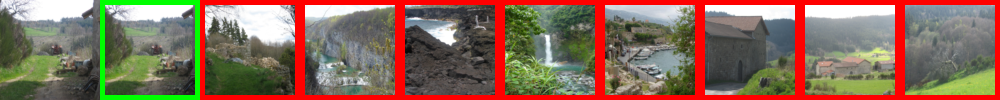

23 ['holidays_small/120800.jpg', 'holidays_small/120800.jpg', 'holidays_small/122504.jpg', 'holidays_small/122503.jpg', 'holidays_small/117200.jpg', 'holidays_small/121601.jpg', 'holidays_small/118900.jpg', 'holidays_small/118901.jpg', 'holidays_small/120801.jpg', 'holidays_small/119001.jpg', 'holidays_small/119000.jpg']


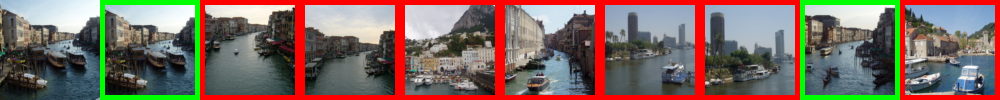

24 ['holidays_small/116200.jpg', 'holidays_small/116200.jpg', 'holidays_small/116201.jpg', 'holidays_small/117802.jpg', 'holidays_small/119501.jpg', 'holidays_small/118501.jpg', 'holidays_small/129501.jpg', 'holidays_small/108203.jpg', 'holidays_small/118202.jpg', 'holidays_small/117601.jpg', 'holidays_small/118000.jpg']


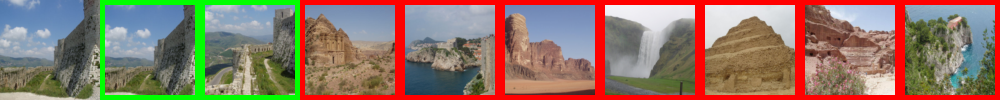

25 ['holidays_small/122300.jpg', 'holidays_small/122300.jpg', 'holidays_small/122302.jpg', 'holidays_small/122301.jpg', 'holidays_small/123400.jpg', 'holidays_small/123403.jpg', 'holidays_small/123401.jpg', 'holidays_small/116801.jpg', 'holidays_small/116800.jpg', 'holidays_small/122501.jpg', 'holidays_small/122500.jpg']


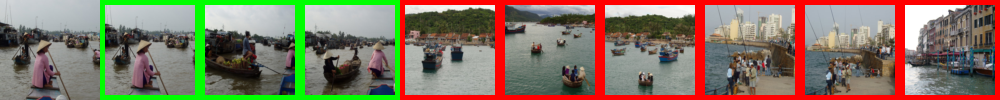

26 ['holidays_small/125400.jpg', 'holidays_small/125400.jpg', 'holidays_small/100801.jpg', 'holidays_small/127900.jpg', 'holidays_small/126701.jpg', 'holidays_small/137102.jpg', 'holidays_small/120100.jpg', 'holidays_small/111500.jpg', 'holidays_small/100900.jpg', 'holidays_small/148401.jpg', 'holidays_small/119604.jpg']


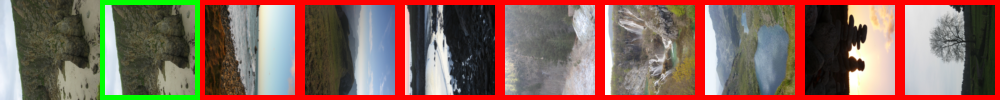

27 ['holidays_small/147500.jpg', 'holidays_small/147500.jpg', 'holidays_small/147501.jpg', 'holidays_small/147502.jpg', 'holidays_small/140001.jpg', 'holidays_small/101504.jpg', 'holidays_small/123602.jpg', 'holidays_small/123601.jpg', 'holidays_small/134601.jpg', 'holidays_small/123600.jpg', 'holidays_small/140000.jpg']


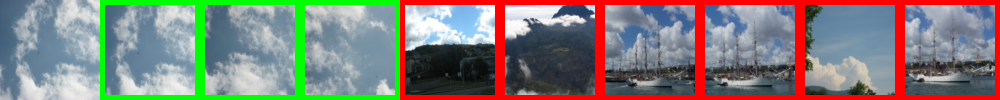

28 ['holidays_small/104700.jpg', 'holidays_small/104700.jpg', 'holidays_small/104701.jpg', 'holidays_small/126702.jpg', 'holidays_small/111001.jpg', 'holidays_small/126804.jpg', 'holidays_small/105103.jpg', 'holidays_small/126704.jpg', 'holidays_small/126501.jpg', 'holidays_small/128201.jpg', 'holidays_small/111002.jpg']


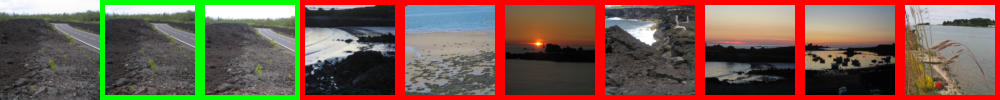

29 ['holidays_small/136100.jpg', 'holidays_small/136100.jpg', 'holidays_small/136102.jpg', 'holidays_small/136103.jpg', 'holidays_small/145902.jpg', 'holidays_small/145800.jpg', 'holidays_small/145701.jpg', 'holidays_small/108300.jpg', 'holidays_small/120500.jpg', 'holidays_small/146202.jpg', 'holidays_small/146207.jpg']


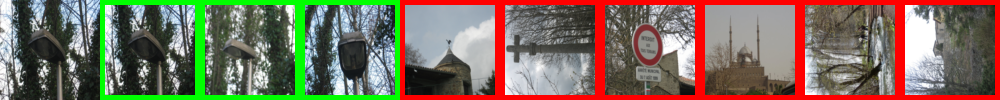

30 ['holidays_small/143200.jpg', 'holidays_small/143200.jpg', 'holidays_small/143201.jpg', 'holidays_small/139105.jpg', 'holidays_small/146302.jpg', 'holidays_small/146400.jpg', 'holidays_small/138102.jpg', 'holidays_small/133703.jpg', 'holidays_small/149401.jpg', 'holidays_small/138900.jpg', 'holidays_small/132901.jpg']


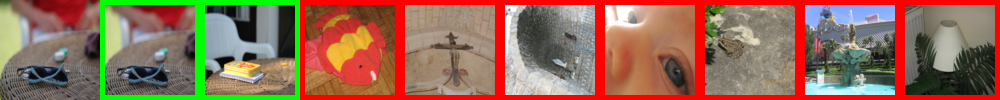

31 ['holidays_small/141000.jpg', 'holidays_small/141000.jpg', 'holidays_small/141001.jpg', 'holidays_small/140501.jpg', 'holidays_small/108601.jpg', 'holidays_small/140502.jpg', 'holidays_small/132300.jpg', 'holidays_small/114002.jpg', 'holidays_small/141101.jpg', 'holidays_small/143000.jpg', 'holidays_small/112700.jpg']


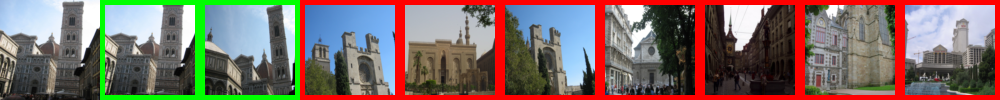

32 ['holidays_small/118300.jpg', 'holidays_small/118300.jpg', 'holidays_small/118302.jpg', 'holidays_small/108501.jpg', 'holidays_small/140200.jpg', 'holidays_small/133100.jpg', 'holidays_small/133101.jpg', 'holidays_small/111700.jpg', 'holidays_small/129500.jpg', 'holidays_small/112602.jpg', 'holidays_small/127802.jpg']


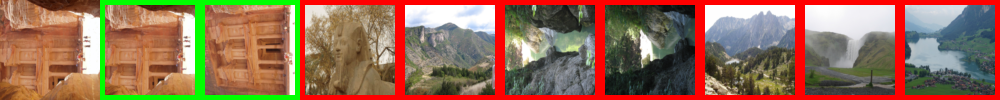

33 ['holidays_small/103600.jpg', 'holidays_small/103600.jpg', 'holidays_small/103601.jpg', 'holidays_small/142700.jpg', 'holidays_small/148601.jpg', 'holidays_small/148602.jpg', 'holidays_small/103801.jpg', 'holidays_small/104801.jpg', 'holidays_small/126301.jpg', 'holidays_small/126600.jpg', 'holidays_small/104802.jpg']


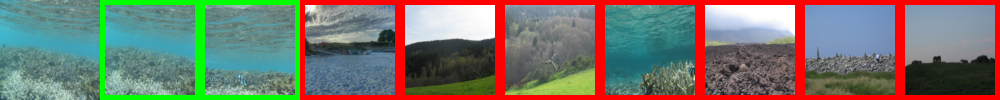

34 ['holidays_small/114700.jpg', 'holidays_small/114700.jpg', 'holidays_small/114702.jpg', 'holidays_small/114703.jpg', 'holidays_small/117501.jpg', 'holidays_small/117200.jpg', 'holidays_small/119203.jpg', 'holidays_small/119900.jpg', 'holidays_small/113500.jpg', 'holidays_small/119100.jpg', 'holidays_small/113502.jpg']


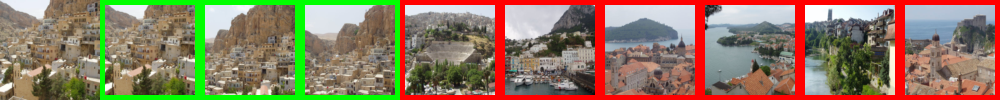

35 ['holidays_small/105200.jpg', 'holidays_small/105200.jpg', 'holidays_small/105201.jpg', 'holidays_small/106702.jpg', 'holidays_small/130401.jpg', 'holidays_small/130400.jpg', 'holidays_small/131102.jpg', 'holidays_small/117300.jpg', 'holidays_small/111401.jpg', 'holidays_small/117302.jpg', 'holidays_small/127300.jpg']


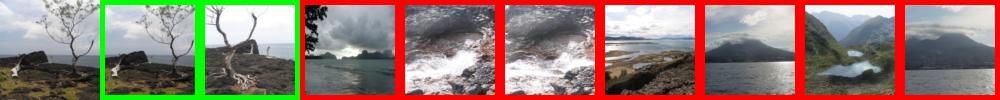

36 ['holidays_small/146700.jpg', 'holidays_small/146700.jpg', 'holidays_small/109901.jpg', 'holidays_small/149102.jpg', 'holidays_small/110702.jpg', 'holidays_small/123000.jpg', 'holidays_small/114501.jpg', 'holidays_small/114504.jpg', 'holidays_small/124701.jpg', 'holidays_small/149100.jpg', 'holidays_small/109900.jpg']


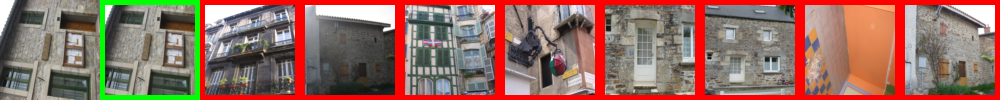

37 ['holidays_small/131800.jpg', 'holidays_small/131800.jpg', 'holidays_small/131801.jpg', 'holidays_small/131802.jpg', 'holidays_small/131803.jpg', 'holidays_small/136501.jpg', 'holidays_small/146801.jpg', 'holidays_small/114901.jpg', 'holidays_small/136900.jpg', 'holidays_small/120201.jpg', 'holidays_small/140900.jpg']


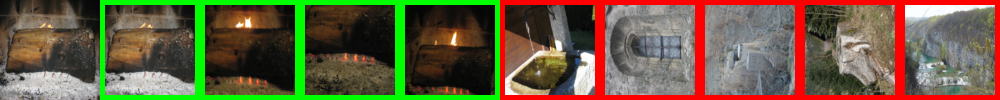

38 ['holidays_small/116000.jpg', 'holidays_small/116000.jpg', 'holidays_small/116001.jpg', 'holidays_small/115500.jpg', 'holidays_small/116002.jpg', 'holidays_small/117801.jpg', 'holidays_small/116201.jpg', 'holidays_small/125401.jpg', 'holidays_small/118200.jpg', 'holidays_small/116200.jpg', 'holidays_small/115501.jpg']


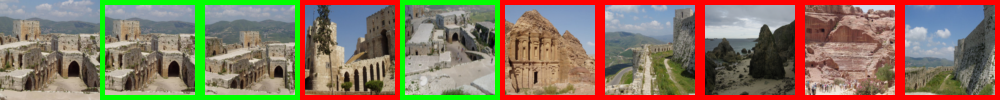

39 ['holidays_small/114500.jpg', 'holidays_small/114500.jpg', 'holidays_small/114501.jpg', 'holidays_small/149100.jpg', 'holidays_small/114503.jpg', 'holidays_small/149101.jpg', 'holidays_small/104300.jpg', 'holidays_small/149102.jpg', 'holidays_small/141101.jpg', 'holidays_small/115500.jpg', 'holidays_small/147801.jpg']


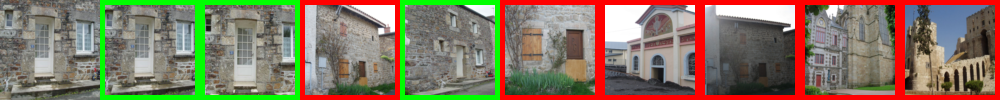

40 ['holidays_small/106000.jpg', 'holidays_small/106000.jpg', 'holidays_small/106002.jpg', 'holidays_small/105400.jpg', 'holidays_small/105401.jpg', 'holidays_small/119700.jpg', 'holidays_small/105600.jpg', 'holidays_small/103301.jpg', 'holidays_small/105601.jpg', 'holidays_small/148004.jpg', 'holidays_small/103300.jpg']


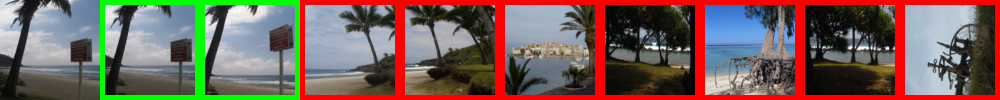

41 ['holidays_small/105800.jpg', 'holidays_small/105800.jpg', 'holidays_small/138802.jpg', 'holidays_small/138800.jpg', 'holidays_small/105801.jpg', 'holidays_small/132901.jpg', 'holidays_small/105802.jpg', 'holidays_small/126801.jpg', 'holidays_small/138803.jpg', 'holidays_small/132902.jpg', 'holidays_small/114001.jpg']


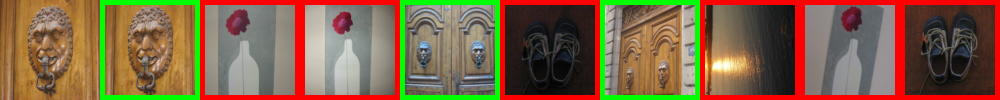

42 ['holidays_small/124000.jpg', 'holidays_small/124000.jpg', 'holidays_small/124301.jpg', 'holidays_small/124300.jpg', 'holidays_small/116801.jpg', 'holidays_small/116800.jpg', 'holidays_small/124002.jpg', 'holidays_small/124001.jpg', 'holidays_small/124302.jpg', 'holidays_small/105002.jpg', 'holidays_small/124201.jpg']


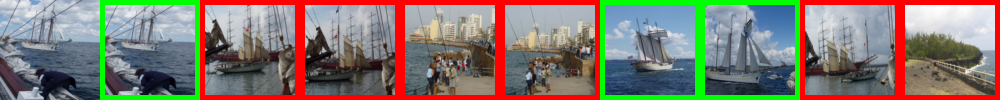

43 ['holidays_small/111600.jpg', 'holidays_small/111600.jpg', 'holidays_small/111703.jpg', 'holidays_small/111701.jpg', 'holidays_small/111702.jpg', 'holidays_small/111601.jpg', 'holidays_small/111501.jpg', 'holidays_small/118201.jpg', 'holidays_small/111401.jpg', 'holidays_small/111700.jpg', 'holidays_small/120101.jpg']


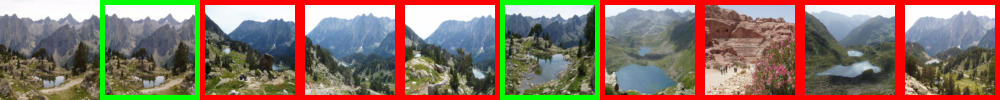

44 ['holidays_small/123900.jpg', 'holidays_small/123900.jpg', 'holidays_small/123901.jpg', 'holidays_small/123801.jpg', 'holidays_small/123600.jpg', 'holidays_small/123602.jpg', 'holidays_small/123601.jpg', 'holidays_small/124101.jpg', 'holidays_small/124100.jpg', 'holidays_small/124201.jpg', 'holidays_small/123800.jpg']


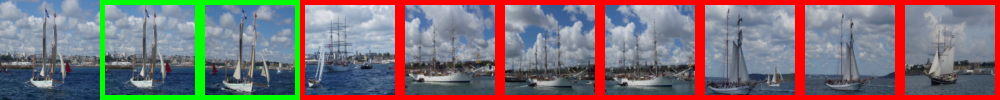

45 ['holidays_small/120500.jpg', 'holidays_small/120500.jpg', 'holidays_small/120501.jpg', 'holidays_small/146202.jpg', 'holidays_small/102500.jpg', 'holidays_small/147603.jpg', 'holidays_small/136900.jpg', 'holidays_small/133200.jpg', 'holidays_small/145700.jpg', 'holidays_small/148100.jpg', 'holidays_small/144900.jpg']


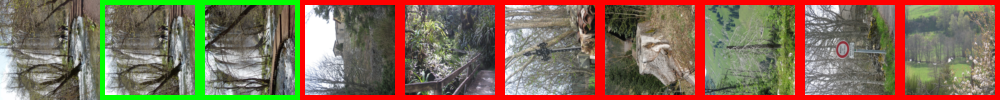

46 ['holidays_small/109200.jpg', 'holidays_small/109200.jpg', 'holidays_small/109201.jpg', 'holidays_small/109101.jpg', 'holidays_small/138502.jpg', 'holidays_small/138604.jpg', 'holidays_small/138500.jpg', 'holidays_small/138307.jpg', 'holidays_small/138600.jpg', 'holidays_small/138601.jpg', 'holidays_small/109100.jpg']


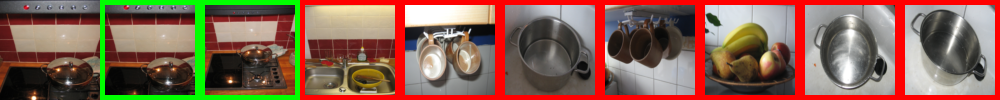

47 ['holidays_small/146000.jpg', 'holidays_small/146000.jpg', 'holidays_small/146003.jpg', 'holidays_small/146002.jpg', 'holidays_small/146001.jpg', 'holidays_small/116801.jpg', 'holidays_small/116601.jpg', 'holidays_small/128701.jpg', 'holidays_small/116600.jpg', 'holidays_small/128700.jpg', 'holidays_small/116803.jpg']


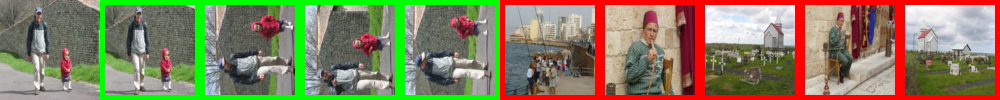

48 ['holidays_small/149000.jpg', 'holidays_small/149000.jpg', 'holidays_small/149001.jpg', 'holidays_small/129700.jpg', 'holidays_small/148900.jpg', 'holidays_small/146301.jpg', 'holidays_small/132301.jpg', 'holidays_small/145301.jpg', 'holidays_small/110500.jpg', 'holidays_small/140500.jpg', 'holidays_small/148901.jpg']


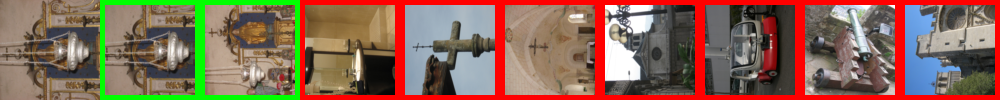

49 ['holidays_small/121100.jpg', 'holidays_small/121100.jpg', 'holidays_small/121101.jpg', 'holidays_small/112002.jpg', 'holidays_small/112003.jpg', 'holidays_small/122000.jpg', 'holidays_small/122502.jpg', 'holidays_small/122501.jpg', 'holidays_small/108001.jpg', 'holidays_small/106100.jpg', 'holidays_small/122302.jpg']


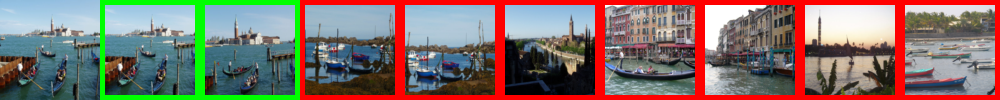

In [155]:
show_result(indices, nqueries=50)

# Convolutional and Dense feature maps
We are going to try a different approach to represent our images. Instead of exctracting a Dense feature from the network we are going to use a convolutional feature. Convolutional feature maps can be quite big and they are in the form **(WxHxC)** where **W** and **H** are the dimensions of the feature map (which is often going to be smaller than the input image size due to the effect of convolutions) and **C** is the number of channels, which corresponds to the number of filters that are learned by the layer.

In order to obtain a compact representation of the image we can use a pooling operator. In particular we are going to use the  [Spatial Pyramid Pooling (SPP)](https://arxiv.org/pdf/1406.4729.pdf). SPP divides each channel of the feature map in a grid in a pyramidal way and computes a pooling operation on every cell grid. The depth of the SPP can be defined by the user.

At depth *i* the feature map is divided into $2^{2i}$ cells:


*   Level 0 --> 1 cell, the whole feature map
*   Level 1 --> 4 cells
*   Level 2 --> 16 cells
*   ...

A notable advantage of SPP is that it provides a fixed size descriptor of size $\sum_{i=0}^{max\_depth} 2^{2i}*num\_channels$.
This allows the feature to be fed into further fully connected layers (that require a fixed input size) even if the input image size changes.


![alt text](https://camo.githubusercontent.com/9099d29d9e59248dff137dd10189e0c81d35aa56/687474703a2f2f692e696d6775722e636f6d2f5351574a566f442e706e67)



Take a look at the summary of your model. Which layers do you think it is better to use here? Which qualitative changes do you expect to see in the results when using one of the first layers and one of the last layers? Why?

In [156]:
# Just to remember the structure of our model and pick a good convolutional layer from which to extract the feature
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In order to obtain SPP features, we are going to first exctract the desired convolutional feature maps and then we are going to pool them in a second step.

In [0]:
from keras.models import Model

# Check the input size required by the model
input_shape = model.input_shape[1:3]

# Choose a layer
layer_name = 'block5_conv3'
layer_output = model.get_layer(layer_name).output

# Creates a model that will return these outputs, given the model input:
extraction_model = Model(inputs=model.input, outputs=layer_output)

In [0]:
output_shape = extraction_model.output_shape

In [159]:
print(output_shape)

(None, 14, 14, 512)


In [0]:
# extract all features

# Preallocate the matrix for storing all the features
all_feats = np.zeros((len(imnames), output_shape[-3], output_shape[-2], output_shape[-1]))

# Extract features
for index, imname in enumerate(imnames):
  all_feats[index] = extract_feature(extraction_model, imname)

In [161]:
print(all_feats.shape)
print(all_feats[0])

(1491, 14, 14, 512)
[[[ 7.67947292  0.          0.         ...  0.         15.6270895
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  ...
  [ 0.          0.          0.         ...  3.06788278  0.
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]]

 [[ 0.          0.          0.         ...  0.         24.71144485
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  ...
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]]

 [[ 0.          0.          0.         ...  0.   

In [0]:
# extract query features

# Extract features for queries
num_queries = len(query_imids)

# Preallocate the matrix for storing all the features for the queries
query_feats = np.zeros((num_queries, output_shape[-3], output_shape[-2], output_shape[-1]))

# Extract features
query_feats = all_feats[query_imids]

In [163]:
print(all_feats.shape)
print(query_feats.shape)

(1491, 14, 14, 512)
(500, 14, 14, 512)


##Exercise - Spatial Pyramid Pooling
Based on the definition of Spatial Pyramid Pooling given above, implement a function that computes it given a convolutional feature map. Pay attention to all the dimentions (input size, number of channels, number of levels in the pyramid).

You can use the [*block_reduce*](http://scikit-image.org/docs/dev/api/skimage.measure.html#block-reduce) that you can find in skimage.measure to compute pooling at each level once you defined the proper kernel dimension...

In [0]:
from skimage.measure import block_reduce
import math

# Perform a SPP with a number of levels equal to "depth" over a convolutional feature
def spp_skimage(feat, depth):
  
  # enumerate how many times the feature map is splitted for each level over both axis
  levels = range(depth)
  
  spp_feat = []
  
  for l in levels:
    # define the pooling region size based on the current level
    dim = 2**l
    
    rows = feat.shape[0] // dim + (feat.shape[0] % dim > 0)
    cols = feat.shape[1] // dim + (feat.shape[1] % dim > 0)

    bl_size = (rows, cols, 1)

    # perform max pooling over each region
    result = block_reduce(feat, block_size = bl_size, func = np.max).ravel()
    spp_feat = np.append(spp_feat, result)

  return spp_feat

In [0]:
# extract all SPP features from the convolutional features

# Extract features

# Preallocate the matrix for storing all the features
all_spp_feats = []

# Choose depth
depth = 2

# Extract features  
for feat in all_feats:
  all_spp_feats.append(spp_skimage(feat, depth))
  
all_spp_feats = np.asarray(all_spp_feats)

In [166]:
print(all_spp_feats.shape)

(1491, 2560)


In [0]:
# extract SPP query features

# Preallocate the matrix for storing all the features for the queries
query_spp_feats = []

# Extract features
query_spp_feats = all_spp_feats[query_imids]

In [168]:
print(query_spp_feats.shape)

(500, 2560)


In [169]:
from sklearn.neighbors import NearestNeighbors#

#SOLUTION
nbrs = NearestNeighbors(n_neighbors=len(imnames), metric='cosine').fit(all_spp_feats)
distances, indices = nbrs.kneighbors(query_spp_feats)

print(distances.shape)
print(indices.shape)
print(indices)

(500, 1491)
(500, 1491)
[[   4 1126 1196 ... 1487  404  964]
 [   7  476 1170 ... 1223  255  345]
 [   9 1073  452 ... 1168  732  345]
 ...
 [1484  387 1207 ...  602  562  875]
 [1487  404  388 ...  209  543  791]
 [1488  281  246 ...  964  209  562]]


In [170]:
print('mean AP = %.3f'%mAP(query_imids, indices))

mean AP = 0.718


0 ['holidays_small/129000.jpg', 'holidays_small/129000.jpg', 'holidays_small/129002.jpg', 'holidays_small/129003.jpg', 'holidays_small/125401.jpg', 'holidays_small/100503.jpg', 'holidays_small/131400.jpg', 'holidays_small/120201.jpg', 'holidays_small/111703.jpg', 'holidays_small/111900.jpg', 'holidays_small/107300.jpg']


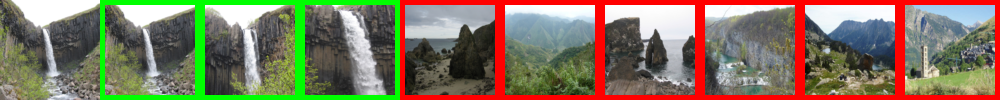

1 ['holidays_small/142000.jpg', 'holidays_small/142000.jpg', 'holidays_small/142001.jpg', 'holidays_small/142003.jpg', 'holidays_small/142002.jpg', 'holidays_small/142004.jpg', 'holidays_small/123100.jpg', 'holidays_small/142200.jpg', 'holidays_small/123201.jpg', 'holidays_small/124500.jpg', 'holidays_small/137503.jpg']


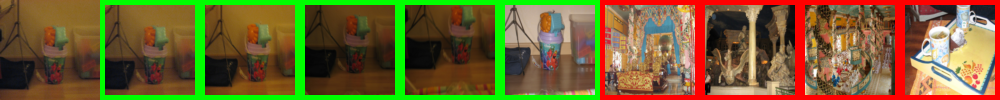

2 ['holidays_small/138500.jpg', 'holidays_small/138500.jpg', 'holidays_small/138506.jpg', 'holidays_small/138501.jpg', 'holidays_small/138502.jpg', 'holidays_small/138503.jpg', 'holidays_small/138303.jpg', 'holidays_small/138301.jpg', 'holidays_small/138305.jpg', 'holidays_small/138505.jpg', 'holidays_small/138306.jpg']


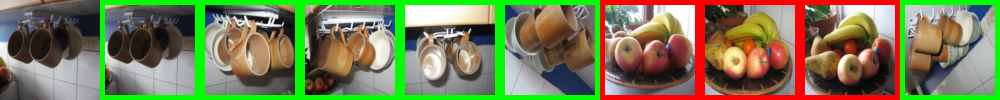

3 ['holidays_small/129900.jpg', 'holidays_small/129900.jpg', 'holidays_small/129901.jpg', 'holidays_small/147502.jpg', 'holidays_small/143702.jpg', 'holidays_small/143701.jpg', 'holidays_small/147101.jpg', 'holidays_small/143900.jpg', 'holidays_small/143501.jpg', 'holidays_small/148601.jpg', 'holidays_small/118600.jpg']


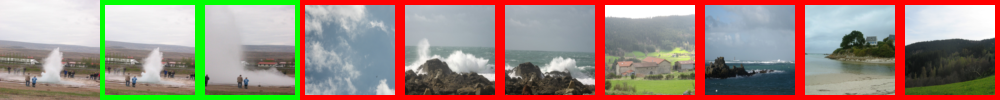

4 ['holidays_small/112700.jpg', 'holidays_small/112700.jpg', 'holidays_small/112701.jpg', 'holidays_small/112800.jpg', 'holidays_small/138401.jpg', 'holidays_small/122102.jpg', 'holidays_small/109900.jpg', 'holidays_small/112801.jpg', 'holidays_small/110702.jpg', 'holidays_small/109901.jpg', 'holidays_small/111101.jpg']


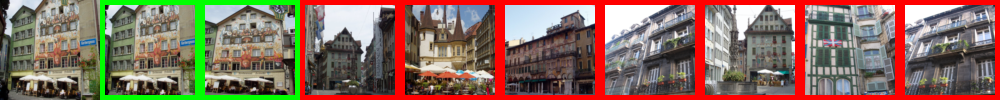

5 ['holidays_small/139100.jpg', 'holidays_small/139100.jpg', 'holidays_small/139104.jpg', 'holidays_small/139101.jpg', 'holidays_small/139103.jpg', 'holidays_small/139102.jpg', 'holidays_small/139105.jpg', 'holidays_small/132701.jpg', 'holidays_small/132700.jpg', 'holidays_small/132101.jpg', 'holidays_small/123003.jpg']


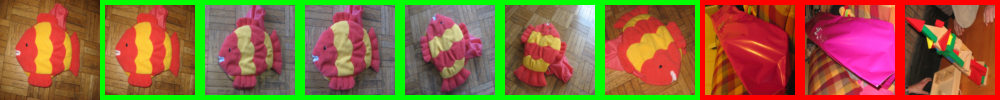

6 ['holidays_small/149600.jpg', 'holidays_small/149600.jpg', 'holidays_small/149603.jpg', 'holidays_small/102900.jpg', 'holidays_small/149601.jpg', 'holidays_small/149401.jpg', 'holidays_small/122101.jpg', 'holidays_small/128700.jpg', 'holidays_small/113402.jpg', 'holidays_small/111901.jpg', 'holidays_small/122002.jpg']


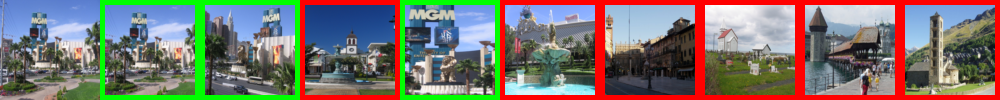

7 ['holidays_small/104500.jpg', 'holidays_small/104500.jpg', 'holidays_small/104502.jpg', 'holidays_small/106101.jpg', 'holidays_small/104501.jpg', 'holidays_small/116700.jpg', 'holidays_small/116701.jpg', 'holidays_small/149801.jpg', 'holidays_small/119000.jpg', 'holidays_small/106100.jpg', 'holidays_small/120701.jpg']


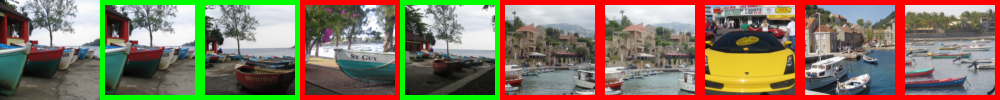

8 ['holidays_small/139700.jpg', 'holidays_small/139700.jpg', 'holidays_small/144200.jpg', 'holidays_small/141500.jpg', 'holidays_small/144201.jpg', 'holidays_small/144601.jpg', 'holidays_small/129400.jpg', 'holidays_small/137703.jpg', 'holidays_small/124701.jpg', 'holidays_small/129300.jpg', 'holidays_small/137704.jpg']


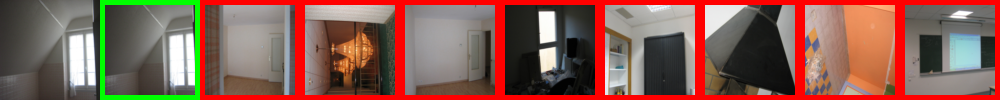

9 ['holidays_small/110300.jpg', 'holidays_small/110300.jpg', 'holidays_small/114301.jpg', 'holidays_small/111200.jpg', 'holidays_small/114702.jpg', 'holidays_small/126900.jpg', 'holidays_small/115301.jpg', 'holidays_small/116100.jpg', 'holidays_small/119603.jpg', 'holidays_small/111002.jpg', 'holidays_small/126401.jpg']


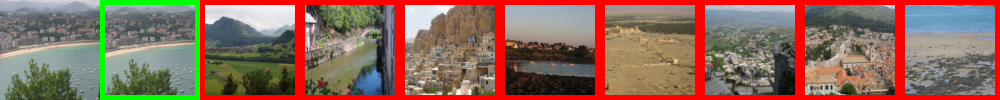

10 ['holidays_small/137500.jpg', 'holidays_small/137500.jpg', 'holidays_small/137501.jpg', 'holidays_small/137502.jpg', 'holidays_small/137503.jpg', 'holidays_small/137504.jpg', 'holidays_small/101100.jpg', 'holidays_small/101101.jpg', 'holidays_small/142004.jpg', 'holidays_small/133802.jpg', 'holidays_small/123201.jpg']


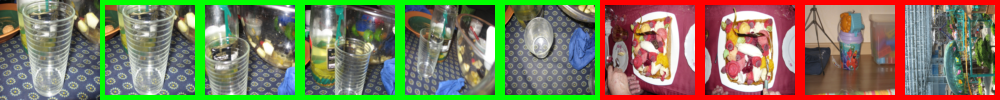

11 ['holidays_small/113700.jpg', 'holidays_small/113700.jpg', 'holidays_small/113701.jpg', 'holidays_small/134802.jpg', 'holidays_small/113501.jpg', 'holidays_small/105104.jpg', 'holidays_small/105102.jpg', 'holidays_small/120101.jpg', 'holidays_small/114201.jpg', 'holidays_small/129003.jpg', 'holidays_small/134502.jpg']


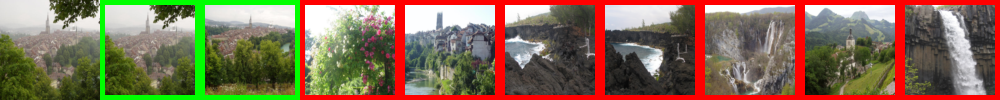

12 ['holidays_small/130100.jpg', 'holidays_small/130100.jpg', 'holidays_small/130101.jpg', 'holidays_small/130102.jpg', 'holidays_small/128800.jpg', 'holidays_small/130400.jpg', 'holidays_small/107700.jpg', 'holidays_small/131102.jpg', 'holidays_small/105900.jpg', 'holidays_small/130401.jpg', 'holidays_small/115300.jpg']


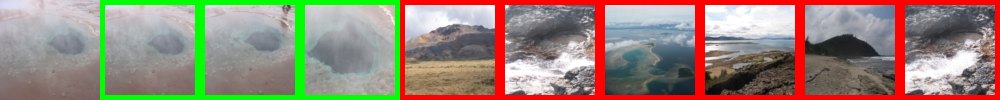

13 ['holidays_small/128100.jpg', 'holidays_small/128100.jpg', 'holidays_small/128101.jpg', 'holidays_small/114900.jpg', 'holidays_small/133202.jpg', 'holidays_small/149101.jpg', 'holidays_small/149100.jpg', 'holidays_small/148201.jpg', 'holidays_small/114502.jpg', 'holidays_small/146900.jpg', 'holidays_small/148202.jpg']


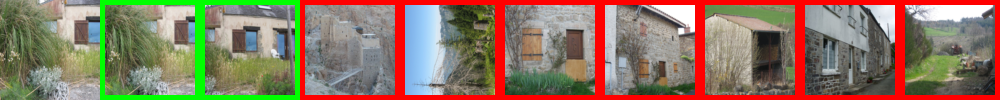

14 ['holidays_small/126300.jpg', 'holidays_small/126300.jpg', 'holidays_small/143500.jpg', 'holidays_small/134201.jpg', 'holidays_small/143904.jpg', 'holidays_small/134200.jpg', 'holidays_small/117302.jpg', 'holidays_small/143501.jpg', 'holidays_small/107301.jpg', 'holidays_small/131301.jpg', 'holidays_small/131201.jpg']


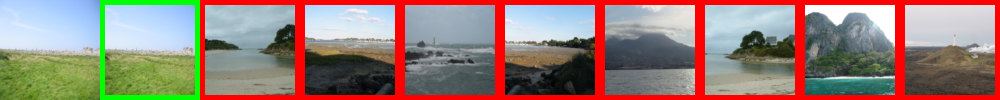

15 ['holidays_small/119100.jpg', 'holidays_small/119100.jpg', 'holidays_small/119101.jpg', 'holidays_small/119203.jpg', 'holidays_small/119201.jpg', 'holidays_small/119603.jpg', 'holidays_small/116702.jpg', 'holidays_small/119202.jpg', 'holidays_small/119200.jpg', 'holidays_small/117500.jpg', 'holidays_small/117501.jpg']


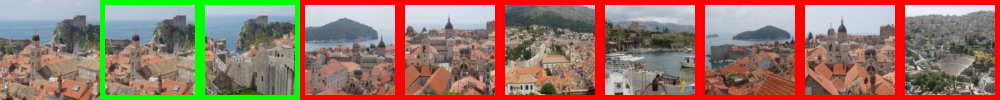

16 ['holidays_small/119400.jpg', 'holidays_small/119400.jpg', 'holidays_small/119401.jpg', 'holidays_small/119000.jpg', 'holidays_small/119801.jpg', 'holidays_small/119300.jpg', 'holidays_small/117400.jpg', 'holidays_small/119800.jpg', 'holidays_small/117200.jpg', 'holidays_small/116700.jpg', 'holidays_small/110000.jpg']


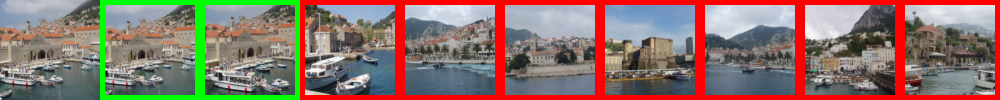

17 ['holidays_small/124800.jpg', 'holidays_small/124800.jpg', 'holidays_small/124801.jpg', 'holidays_small/133600.jpg', 'holidays_small/107702.jpg', 'holidays_small/124802.jpg', 'holidays_small/127901.jpg', 'holidays_small/102802.jpg', 'holidays_small/107700.jpg', 'holidays_small/131102.jpg', 'holidays_small/107701.jpg']


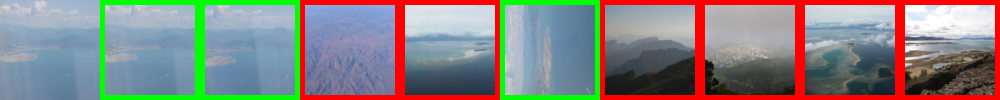

18 ['holidays_small/104900.jpg', 'holidays_small/104900.jpg', 'holidays_small/104901.jpg', 'holidays_small/104902.jpg', 'holidays_small/119800.jpg', 'holidays_small/120400.jpg', 'holidays_small/122203.jpg', 'holidays_small/140802.jpg', 'holidays_small/120401.jpg', 'holidays_small/148300.jpg', 'holidays_small/128700.jpg']


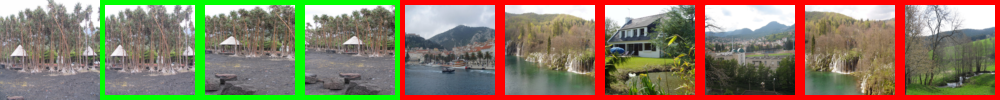

19 ['holidays_small/142500.jpg', 'holidays_small/142500.jpg', 'holidays_small/142502.jpg', 'holidays_small/142501.jpg', 'holidays_small/142601.jpg', 'holidays_small/108900.jpg', 'holidays_small/142003.jpg', 'holidays_small/144402.jpg', 'holidays_small/108901.jpg', 'holidays_small/149800.jpg', 'holidays_small/139004.jpg']


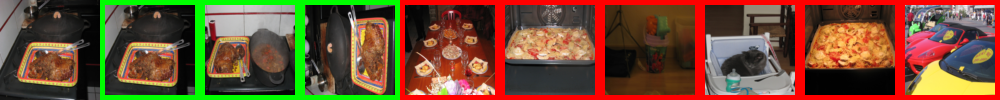

20 ['holidays_small/123400.jpg', 'holidays_small/123400.jpg', 'holidays_small/123401.jpg', 'holidays_small/123404.jpg', 'holidays_small/123403.jpg', 'holidays_small/116700.jpg', 'holidays_small/112000.jpg', 'holidays_small/117201.jpg', 'holidays_small/119001.jpg', 'holidays_small/119800.jpg', 'holidays_small/117200.jpg']


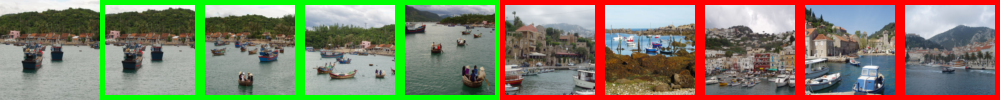

21 ['holidays_small/134100.jpg', 'holidays_small/134100.jpg', 'holidays_small/134101.jpg', 'holidays_small/131805.jpg', 'holidays_small/131803.jpg', 'holidays_small/131801.jpg', 'holidays_small/127000.jpg', 'holidays_small/127001.jpg', 'holidays_small/139402.jpg', 'holidays_small/142004.jpg', 'holidays_small/132801.jpg']


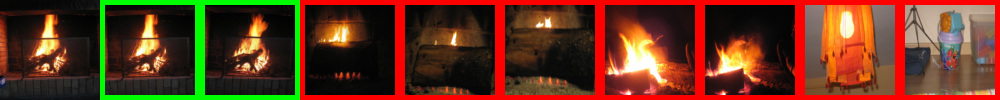

22 ['holidays_small/146900.jpg', 'holidays_small/146900.jpg', 'holidays_small/146101.jpg', 'holidays_small/105000.jpg', 'holidays_small/112602.jpg', 'holidays_small/136702.jpg', 'holidays_small/116901.jpg', 'holidays_small/147101.jpg', 'holidays_small/105104.jpg', 'holidays_small/146901.jpg', 'holidays_small/146100.jpg']


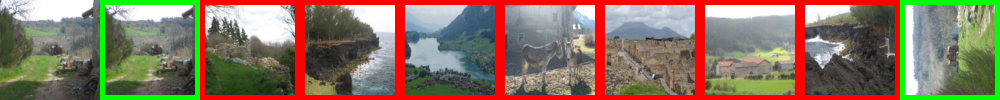

23 ['holidays_small/120800.jpg', 'holidays_small/120800.jpg', 'holidays_small/122503.jpg', 'holidays_small/122504.jpg', 'holidays_small/120801.jpg', 'holidays_small/121601.jpg', 'holidays_small/119000.jpg', 'holidays_small/116702.jpg', 'holidays_small/114401.jpg', 'holidays_small/119001.jpg', 'holidays_small/120701.jpg']


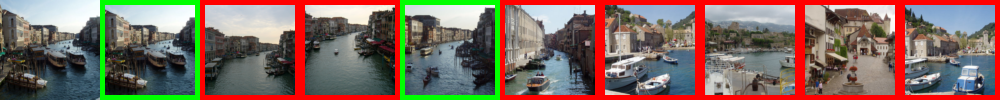

24 ['holidays_small/116200.jpg', 'holidays_small/116200.jpg', 'holidays_small/116201.jpg', 'holidays_small/136600.jpg', 'holidays_small/119501.jpg', 'holidays_small/112400.jpg', 'holidays_small/115501.jpg', 'holidays_small/116402.jpg', 'holidays_small/116301.jpg', 'holidays_small/116300.jpg', 'holidays_small/115500.jpg']


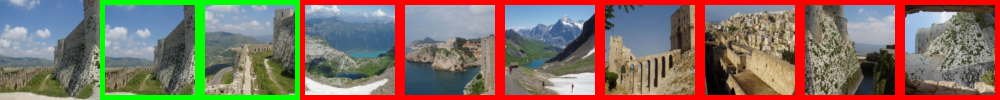

25 ['holidays_small/122300.jpg', 'holidays_small/122300.jpg', 'holidays_small/122301.jpg', 'holidays_small/122302.jpg', 'holidays_small/116801.jpg', 'holidays_small/124300.jpg', 'holidays_small/116800.jpg', 'holidays_small/120703.jpg', 'holidays_small/124302.jpg', 'holidays_small/120701.jpg', 'holidays_small/144400.jpg']


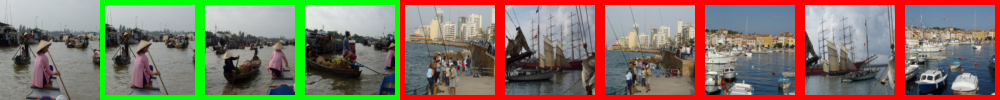

26 ['holidays_small/125400.jpg', 'holidays_small/125400.jpg', 'holidays_small/120100.jpg', 'holidays_small/111500.jpg', 'holidays_small/127700.jpg', 'holidays_small/126701.jpg', 'holidays_small/127900.jpg', 'holidays_small/117700.jpg', 'holidays_small/127701.jpg', 'holidays_small/114902.jpg', 'holidays_small/119604.jpg']


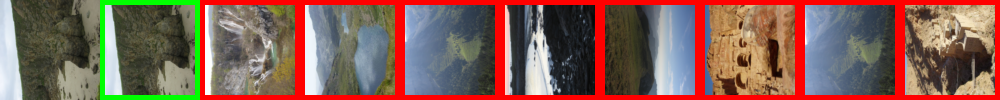

27 ['holidays_small/147500.jpg', 'holidays_small/147500.jpg', 'holidays_small/147501.jpg', 'holidays_small/147502.jpg', 'holidays_small/101503.jpg', 'holidays_small/140001.jpg', 'holidays_small/148603.jpg', 'holidays_small/101504.jpg', 'holidays_small/137102.jpg', 'holidays_small/130102.jpg', 'holidays_small/128800.jpg']


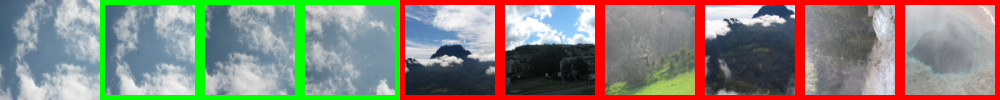

28 ['holidays_small/104700.jpg', 'holidays_small/104700.jpg', 'holidays_small/104701.jpg', 'holidays_small/111002.jpg', 'holidays_small/111001.jpg', 'holidays_small/111000.jpg', 'holidays_small/115301.jpg', 'holidays_small/105103.jpg', 'holidays_small/131201.jpg', 'holidays_small/130700.jpg', 'holidays_small/137007.jpg']


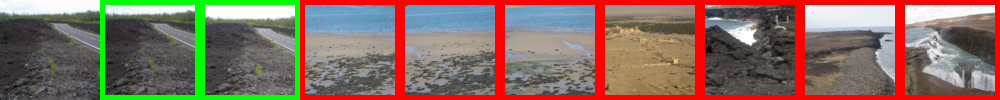

29 ['holidays_small/136100.jpg', 'holidays_small/136100.jpg', 'holidays_small/136102.jpg', 'holidays_small/136103.jpg', 'holidays_small/120501.jpg', 'holidays_small/108501.jpg', 'holidays_small/148201.jpg', 'holidays_small/133900.jpg', 'holidays_small/142200.jpg', 'holidays_small/132302.jpg', 'holidays_small/137006.jpg']


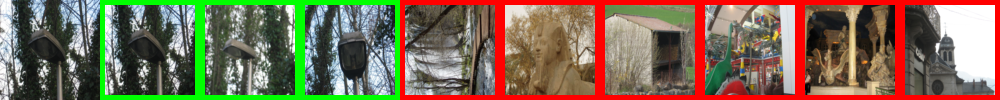

30 ['holidays_small/143200.jpg', 'holidays_small/143200.jpg', 'holidays_small/143201.jpg', 'holidays_small/146002.jpg', 'holidays_small/123201.jpg', 'holidays_small/146800.jpg', 'holidays_small/112201.jpg', 'holidays_small/121201.jpg', 'holidays_small/101101.jpg', 'holidays_small/121400.jpg', 'holidays_small/109501.jpg']


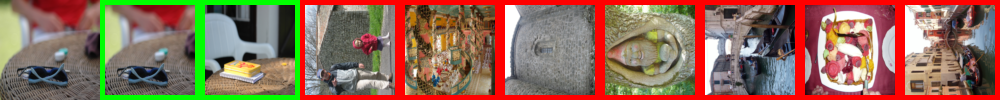

31 ['holidays_small/141000.jpg', 'holidays_small/141000.jpg', 'holidays_small/141001.jpg', 'holidays_small/104300.jpg', 'holidays_small/113000.jpg', 'holidays_small/108601.jpg', 'holidays_small/149300.jpg', 'holidays_small/146200.jpg', 'holidays_small/104301.jpg', 'holidays_small/128501.jpg', 'holidays_small/117801.jpg']


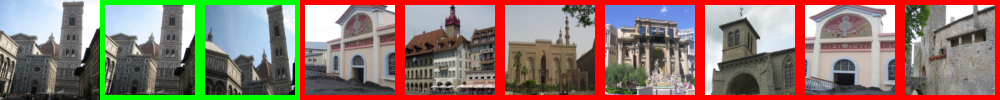

32 ['holidays_small/118300.jpg', 'holidays_small/118300.jpg', 'holidays_small/118302.jpg', 'holidays_small/118301.jpg', 'holidays_small/108501.jpg', 'holidays_small/140200.jpg', 'holidays_small/119603.jpg', 'holidays_small/141200.jpg', 'holidays_small/113900.jpg', 'holidays_small/118500.jpg', 'holidays_small/111901.jpg']


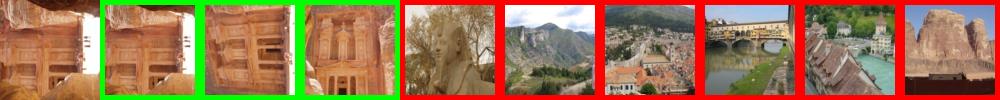

33 ['holidays_small/103600.jpg', 'holidays_small/103600.jpg', 'holidays_small/103601.jpg', 'holidays_small/103801.jpg', 'holidays_small/133600.jpg', 'holidays_small/106201.jpg', 'holidays_small/106200.jpg', 'holidays_small/104801.jpg', 'holidays_small/103500.jpg', 'holidays_small/104800.jpg', 'holidays_small/148602.jpg']


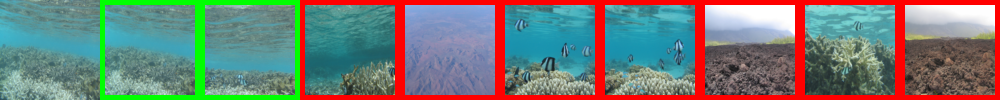

34 ['holidays_small/114700.jpg', 'holidays_small/114700.jpg', 'holidays_small/114702.jpg', 'holidays_small/114703.jpg', 'holidays_small/119100.jpg', 'holidays_small/119203.jpg', 'holidays_small/124600.jpg', 'holidays_small/119603.jpg', 'holidays_small/119101.jpg', 'holidays_small/117501.jpg', 'holidays_small/119300.jpg']


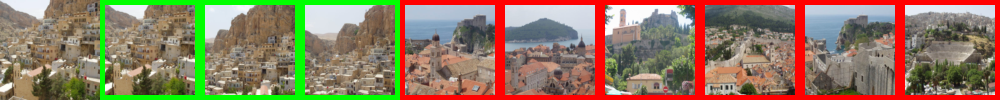

35 ['holidays_small/105200.jpg', 'holidays_small/105200.jpg', 'holidays_small/105201.jpg', 'holidays_small/117300.jpg', 'holidays_small/126202.jpg', 'holidays_small/106603.jpg', 'holidays_small/143900.jpg', 'holidays_small/146101.jpg', 'holidays_small/127300.jpg', 'holidays_small/101503.jpg', 'holidays_small/114801.jpg']


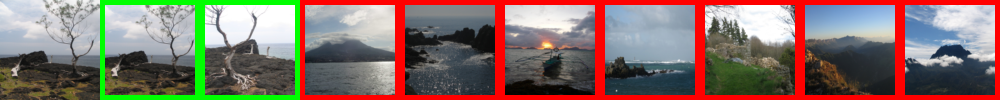

36 ['holidays_small/146700.jpg', 'holidays_small/146700.jpg', 'holidays_small/109901.jpg', 'holidays_small/110702.jpg', 'holidays_small/114501.jpg', 'holidays_small/149102.jpg', 'holidays_small/147802.jpg', 'holidays_small/114504.jpg', 'holidays_small/120001.jpg', 'holidays_small/118302.jpg', 'holidays_small/141704.jpg']


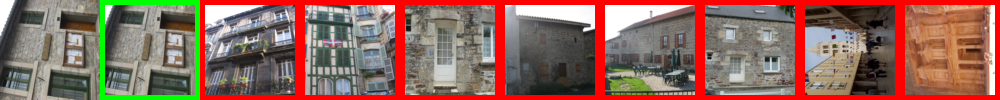

37 ['holidays_small/131800.jpg', 'holidays_small/131800.jpg', 'holidays_small/131801.jpg', 'holidays_small/131803.jpg', 'holidays_small/131802.jpg', 'holidays_small/140900.jpg', 'holidays_small/136600.jpg', 'holidays_small/120201.jpg', 'holidays_small/112101.jpg', 'holidays_small/112100.jpg', 'holidays_small/116200.jpg']


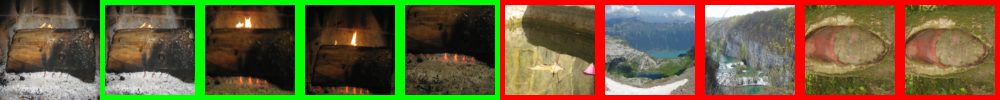

38 ['holidays_small/116000.jpg', 'holidays_small/116000.jpg', 'holidays_small/116001.jpg', 'holidays_small/115500.jpg', 'holidays_small/117801.jpg', 'holidays_small/141202.jpg', 'holidays_small/116201.jpg', 'holidays_small/115501.jpg', 'holidays_small/116900.jpg', 'holidays_small/122002.jpg', 'holidays_small/119101.jpg']


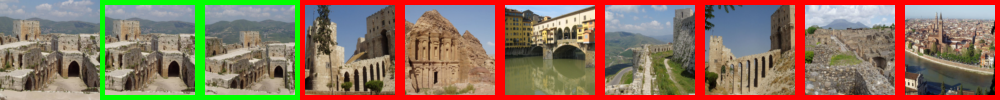

39 ['holidays_small/114500.jpg', 'holidays_small/114500.jpg', 'holidays_small/114501.jpg', 'holidays_small/114503.jpg', 'holidays_small/122201.jpg', 'holidays_small/147801.jpg', 'holidays_small/148203.jpg', 'holidays_small/118303.jpg', 'holidays_small/148200.jpg', 'holidays_small/114504.jpg', 'holidays_small/149101.jpg']


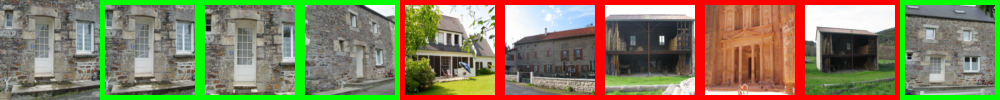

40 ['holidays_small/106000.jpg', 'holidays_small/106000.jpg', 'holidays_small/106002.jpg', 'holidays_small/105400.jpg', 'holidays_small/105401.jpg', 'holidays_small/105500.jpg', 'holidays_small/100100.jpg', 'holidays_small/105600.jpg', 'holidays_small/103304.jpg', 'holidays_small/105501.jpg', 'holidays_small/137800.jpg']


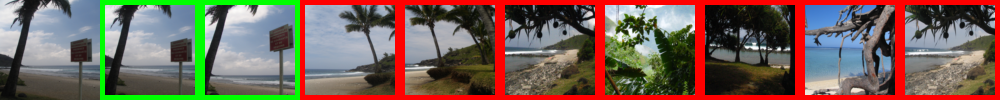

41 ['holidays_small/105800.jpg', 'holidays_small/105800.jpg', 'holidays_small/112201.jpg', 'holidays_small/105801.jpg', 'holidays_small/149201.jpg', 'holidays_small/117700.jpg', 'holidays_small/149200.jpg', 'holidays_small/105802.jpg', 'holidays_small/132902.jpg', 'holidays_small/132900.jpg', 'holidays_small/123201.jpg']


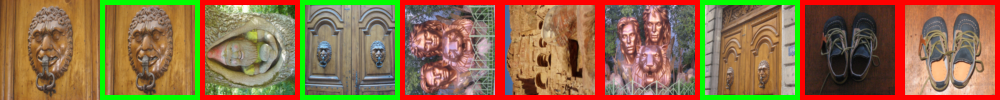

42 ['holidays_small/124000.jpg', 'holidays_small/124000.jpg', 'holidays_small/124001.jpg', 'holidays_small/124300.jpg', 'holidays_small/124301.jpg', 'holidays_small/124302.jpg', 'holidays_small/122300.jpg', 'holidays_small/132601.jpg', 'holidays_small/136501.jpg', 'holidays_small/128201.jpg', 'holidays_small/124002.jpg']


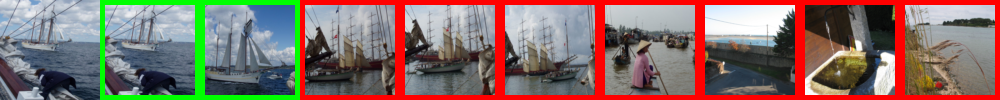

43 ['holidays_small/111600.jpg', 'holidays_small/111600.jpg', 'holidays_small/111703.jpg', 'holidays_small/111701.jpg', 'holidays_small/111702.jpg', 'holidays_small/111601.jpg', 'holidays_small/111501.jpg', 'holidays_small/107301.jpg', 'holidays_small/127300.jpg', 'holidays_small/136400.jpg', 'holidays_small/111401.jpg']


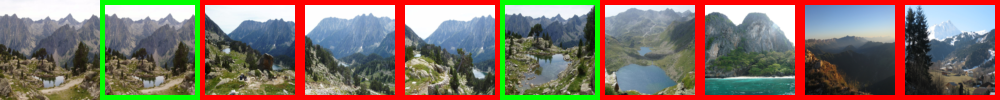

44 ['holidays_small/123900.jpg', 'holidays_small/123900.jpg', 'holidays_small/123901.jpg', 'holidays_small/124100.jpg', 'holidays_small/124101.jpg', 'holidays_small/123801.jpg', 'holidays_small/123600.jpg', 'holidays_small/123700.jpg', 'holidays_small/124201.jpg', 'holidays_small/123602.jpg', 'holidays_small/123601.jpg']


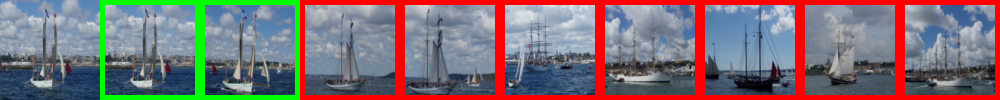

45 ['holidays_small/120500.jpg', 'holidays_small/120500.jpg', 'holidays_small/120501.jpg', 'holidays_small/102500.jpg', 'holidays_small/134503.jpg', 'holidays_small/147302.jpg', 'holidays_small/136900.jpg', 'holidays_small/137005.jpg', 'holidays_small/140800.jpg', 'holidays_small/137007.jpg', 'holidays_small/147304.jpg']


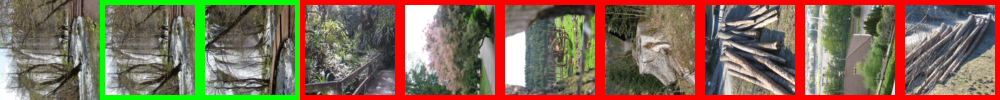

46 ['holidays_small/109200.jpg', 'holidays_small/109200.jpg', 'holidays_small/109201.jpg', 'holidays_small/109101.jpg', 'holidays_small/138502.jpg', 'holidays_small/122801.jpg', 'holidays_small/141200.jpg', 'holidays_small/138307.jpg', 'holidays_small/138604.jpg', 'holidays_small/138600.jpg', 'holidays_small/122800.jpg']


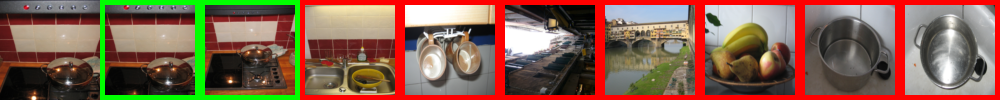

47 ['holidays_small/146000.jpg', 'holidays_small/146000.jpg', 'holidays_small/146002.jpg', 'holidays_small/146003.jpg', 'holidays_small/146001.jpg', 'holidays_small/116601.jpg', 'holidays_small/116600.jpg', 'holidays_small/142200.jpg', 'holidays_small/142100.jpg', 'holidays_small/142001.jpg', 'holidays_small/118400.jpg']


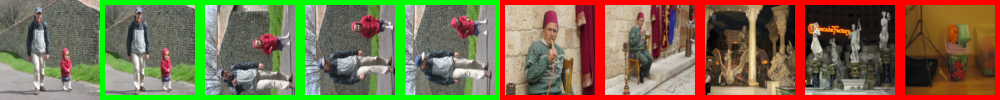

48 ['holidays_small/149000.jpg', 'holidays_small/149000.jpg', 'holidays_small/149001.jpg', 'holidays_small/138501.jpg', 'holidays_small/134001.jpg', 'holidays_small/133003.jpg', 'holidays_small/138001.jpg', 'holidays_small/133001.jpg', 'holidays_small/133000.jpg', 'holidays_small/133002.jpg', 'holidays_small/102201.jpg']


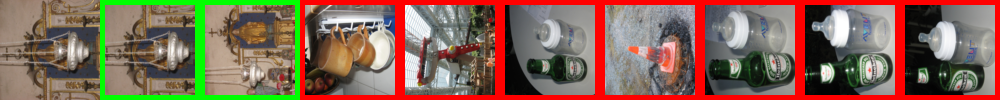

49 ['holidays_small/121100.jpg', 'holidays_small/121100.jpg', 'holidays_small/121101.jpg', 'holidays_small/112002.jpg', 'holidays_small/112003.jpg', 'holidays_small/122302.jpg', 'holidays_small/121404.jpg', 'holidays_small/122000.jpg', 'holidays_small/122502.jpg', 'holidays_small/122301.jpg', 'holidays_small/116702.jpg']


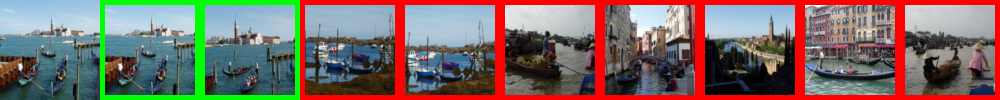

In [171]:
show_result(indices, nqueries=50)

## Questions
What happens if you change layer?

As before, try different metrics and discuss the results.

**Test using block4_conv3 instead of block5_conv3 (and using different depth values)**

In [0]:
from keras.models import Model

# Check the input size required by the model
input_shape = model.input_shape[1:3]

# Choose a layer
layer_name = 'block4_conv3'
layer_output = model.get_layer(layer_name).output

# Creates a model that will return these outputs, given the model input:
extraction_model = Model(inputs=model.input, outputs=layer_output)

In [0]:
output_shape = extraction_model.output_shape

In [174]:
print(output_shape)

(None, 28, 28, 512)


In [0]:
# extract all features

# Preallocate the matrix for storing all the features
all_feats = np.zeros((len(imnames), output_shape[-3], output_shape[-2], output_shape[-1]))

# Extract features
for index, imname in enumerate(imnames):
  all_feats[index] = extract_feature(extraction_model, imname)

In [176]:
print(all_feats.shape)
print(all_feats[0])

(1491, 28, 28, 512)
[[[ 75.85164642   0.         190.19805908 ...   0.           0.
     0.        ]
  [403.76803589   0.          99.62335205 ...   0.           0.
     0.        ]
  [386.68603516   0.           0.         ...   0.           0.
     0.        ]
  ...
  [  0.           0.           0.         ...   0.           0.
     0.        ]
  [  0.           0.           0.         ...   0.           0.
     0.        ]
  [257.90414429   0.          38.38526917 ...   0.           0.
     0.        ]]

 [[  0.           0.           0.         ...   0.           0.
     0.        ]
  [ 53.91932297   0.           0.         ...   0.           0.
     0.        ]
  [  0.           0.           0.         ...   0.           0.
     0.        ]
  ...
  [  0.           0.           0.         ...   0.           0.
     0.        ]
  [  0.           0.           0.         ...   0.           0.
     0.        ]
  [156.83543396   0.           0.         ...   0.           0.
     0.    

In [0]:
# extract query features

# Extract features for queries
num_queries = len(query_imids)

# Preallocate the matrix for storing all the features for the queries
query_feats = np.zeros((num_queries, output_shape[-3], output_shape[-2], output_shape[-1]))

# Extract features
query_feats = all_feats[query_imids]

In [178]:
print(all_feats.shape)
print(query_feats.shape)

(1491, 28, 28, 512)
(500, 28, 28, 512)


In [0]:
from skimage.measure import block_reduce
import math

# Perform a SPP with a number of levels equal to "depth" over a convolutional feature
def spp_skimage(feat, depth):
  
  # enumerate how many times the feature map is splitted for each level over both axis
  levels = range(depth)
  
  spp_feat = []
  
  for l in levels:
    # define the pooling region size based on the current level
    dim = 2**l
    
    rows = feat.shape[0] // dim + (feat.shape[0] % dim > 0)
    cols = feat.shape[1] // dim + (feat.shape[1] % dim > 0)

    bl_size = (rows, cols, 1)

    # perform max pooling over each region
    result = block_reduce(feat, block_size = bl_size, func = np.max).ravel()
    spp_feat = np.append(spp_feat, result)

  return spp_feat

In [0]:
# extract all SPP features from the convolutional features

# Extract features

# Preallocate the matrix for storing all the features
all_spp_feats = []

# Choose depth
depth = 3

# Extract features  
for feat in all_feats:
  all_spp_feats.append(spp_skimage(feat, depth))
  
all_spp_feats = np.asarray(all_spp_feats)

In [181]:
print(all_spp_feats.shape)

(1491, 10752)


In [0]:
# extract SPP query features

# Preallocate the matrix for storing all the features for the queries
query_spp_feats = []

# Extract features
query_spp_feats = all_spp_feats[query_imids]

In [183]:
print(query_spp_feats.shape)

(500, 10752)


In [184]:
from sklearn.neighbors import NearestNeighbors#

#SOLUTION
nbrs = NearestNeighbors(n_neighbors=len(imnames), metric='cosine').fit(all_spp_feats)
distances, indices = nbrs.kneighbors(query_spp_feats)

print(distances.shape)
print(indices.shape)
print(indices)

(500, 1491)
(500, 1491)
[[   4 1126  330 ...  244   34  574]
 [   7  476 1170 ... 1487  404  574]
 [   9 1073  452 ... 1180  244  574]
 ...
 [1484  387  889 ...  244  574   34]
 [1487  404  388 ... 1263  356  542]
 [1488 1345  281 ...  244   34  574]]


In [185]:
print('mean AP = %.3f'%mAP(query_imids, indices))

mean AP = 0.662


**Test concatenating both fc2 and block5_conv3**

In [0]:
from keras.models import Model

# Check the input size required by the model
input_shape = model.input_shape[1:3]

# Choose a layer
layer_name = 'block5_conv3'
layer_output = model.get_layer(layer_name).output

# Creates a model that will return these outputs, given the model input:
extraction_model = Model(inputs=model.input, outputs=layer_output)

In [0]:
output_shape = extraction_model.output_shape

In [188]:
print(output_shape)

(None, 14, 14, 512)


In [0]:
# extract all features

# Preallocate the matrix for storing all the features
all_feats = np.zeros((len(imnames), output_shape[-3], output_shape[-2], output_shape[-1]))

# Extract features
for index, imname in enumerate(imnames):
  all_feats[index] = extract_feature(extraction_model, imname)

In [190]:
print(all_feats.shape)
print(all_feats[0])

(1491, 14, 14, 512)
[[[ 7.67947292  0.          0.         ...  0.         15.6270895
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  ...
  [ 0.          0.          0.         ...  3.06788278  0.
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]]

 [[ 0.          0.          0.         ...  0.         24.71144485
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  ...
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]]

 [[ 0.          0.          0.         ...  0.   

In [0]:
# extract query features

# Extract features for queries
num_queries = len(query_imids)

# Preallocate the matrix for storing all the features for the queries
query_feats = np.zeros((num_queries, output_shape[-3], output_shape[-2], output_shape[-1]))

# Extract features
query_feats = all_feats[query_imids]

In [192]:
print(all_feats.shape)
print(query_feats.shape)

(1491, 14, 14, 512)
(500, 14, 14, 512)


In [0]:
from skimage.measure import block_reduce
import math

# Perform a SPP with a number of levels equal to "depth" over a convolutional feature
def spp_skimage(feat, depth):
  
  # enumerate how many times the feature map is splitted for each level over both axis
  levels = range(depth)
  
  spp_feat = []
  
  for l in levels:
    # define the pooling region size based on the current level
    dim = 2**l
    
    rows = feat.shape[0] // dim + (feat.shape[0] % dim > 0)
    cols = feat.shape[1] // dim + (feat.shape[1] % dim > 0)

    bl_size = (rows, cols, 1)

    # perform max pooling over each region
    result = block_reduce(feat, block_size = bl_size, func = np.max).ravel()
    spp_feat = np.append(spp_feat, result)

  return spp_feat

In [0]:
# extract all SPP features from the convolutional features

# Extract features

# Preallocate the matrix for storing all the features
all_spp_feats = []

# Choose depth
depth = 2

# Extract features  
for feat in all_feats:
  all_spp_feats.append(spp_skimage(feat, depth))
  
all_spp_feats = np.asarray(all_spp_feats)

In [195]:
print(all_spp_feats.shape)

(1491, 2560)


In [0]:
from keras.models import Model

# Check the input size required by the model
input_shape = model.input_shape[1:3]

# Choose a layer
layer_name = 'fc2'
layer_output = model.get_layer(layer_name).output

# Creates a model that will return these outputs, given the model input:
extraction_model = Model(inputs=model.input, outputs=layer_output)

In [0]:
# extract all features

num_imgs = len(imnames)

# Get the size of the feature we are using
feat_size = output_shape = extraction_model.output_shape[-1]

# Preallocate the matrix for storing all the features
all_fc_feats = np.zeros((len(imnames), feat_size))

# Extract features
for index, imname in enumerate(imnames):
  all_fc_feats[index] = extract_feature(extraction_model, imname)

In [198]:
print(all_fc_feats.shape)
print(all_fc_feats)

(1491, 4096)
[[0.6733743  0.         0.16263026 ... 0.         0.         0.        ]
 [4.13992834 0.         1.2700206  ... 0.55423707 0.4360885  0.        ]
 [3.06232071 0.         0.03876108 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         2.9932394  ... 1.02149749 0.         0.        ]
 [0.         0.         3.00017834 ... 0.         0.         0.        ]]


In [0]:
all_feats = np.hstack((all_spp_feats, all_fc_feats))

In [200]:
print(all_feats.shape)

(1491, 6656)


In [0]:
# extract SPP query features

# Preallocate the matrix for storing all the features for the queries
query_feats = []

# Extract features
query_feats = all_feats[query_imids]

In [202]:
print(query_feats.shape)

(500, 6656)


In [203]:
from sklearn.neighbors import NearestNeighbors#

#SOLUTION
nbrs = NearestNeighbors(n_neighbors=len(imnames), metric='cosine').fit(all_feats)
distances, indices = nbrs.kneighbors(query_feats)

print(distances.shape)
print(indices.shape)
print(indices)

(500, 1491)
(500, 1491)
[[   4 1126 1196 ...  255  404  964]
 [   7  476 1170 ...  388  345  255]
 [   9 1073  452 ... 1168  732  345]
 ...
 [1484  387 1207 ...  875  388  255]
 [1487  404  388 ...  543  209  791]
 [1488  281  246 ...  964  209  562]]


In [204]:
print('mean AP = %.3f'%mAP(query_imids, indices))

mean AP = 0.720
